In [2]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama as scnrma
import pandas as pd
import seaborn as sns

from matplotlib.colors import ListedColormap

import warnings

warnings.filterwarnings('ignore')

sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=200)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


This notebook continues from `Non-neurons_NR_init.ipynb`

# Astrocytes

can re-cluster alone at each time then map over time 

can find markers for the clusters

5, 3, 2, 2, 2, 2 is the number of clusters of astrocytes over time.

Astro_C1 is the larger one and Astro_C2 is the smaller one

## P8_astro

In [17]:
#comment out for re-analysis after removing contaminants
'''
P8_astro = P8[P8.obs.leiden=='3',:].concatenate(P8[P8.obs.leiden=='1',:], 
                                               P8[P8.obs.leiden=='2',:],
                                               P8[P8.obs.leiden=='4',:],
                                               P8[P8.obs.leiden=='7',:],)


C3_to_0 = list(pd.read_csv(path + 'P8_C3_to_P14_C0.csv')['cell_id'].values)
C3_to_3 = list(pd.read_csv(path + 'P8_C3_to_P14_C3.csv')['cell_id'].values)

P8_astro_clust = []
for i in range(P8_astro.shape[0]):
    if ( int(P8_astro.obs.leiden[i]) in (1,2) ): P8_astro_clust.append('Astro_C1')
    elif ( int(P8_astro.obs.leiden[i]) in (4,7) ): P8_astro_clust.append('Astro_C2')
    elif ( int(P8_astro.obs.leiden[i]) in (3, 324234) ):
        if (P8_astro.obs.index[i] in C3_to_0): P8_astro_clust.append('Astro_C1')
        else: P8_astro_clust.append('Astro_C2')
            
P8_astro.obs['Astro_Num'] = P8_astro.obs['leiden']
P8_astro.obs['Astro_Num'] = pd.Series(P8_astro_clust, dtype='category').values
print(P8_astro.shape[0], len(P8_astro_clust))


P8_astro
'''

del P8_astro.obsp
del P8_astro.varm
del P8_astro.obsm
del P8_astro.uns


P8_astro.X = P8_astro.raw.X
sc.pp.highly_variable_genes(P8_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P8_astro, max_value=10) #scale
sc.tl.pca(P8_astro, svd_solver='arpack') #run PCA

Z = harmonize(P8_astro.obsm['X_pca'], P8_astro.obs, batch_key = 'sample')
P8_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P8_astro, n_neighbors=25, use_rep='X_harmony')

#sc.pp.neighbors(P8_astro, n_neighbors=25)
#bbknn(P8_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
sc.tl.leiden(P8_astro)
sc.tl.umap(P8_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, catego

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


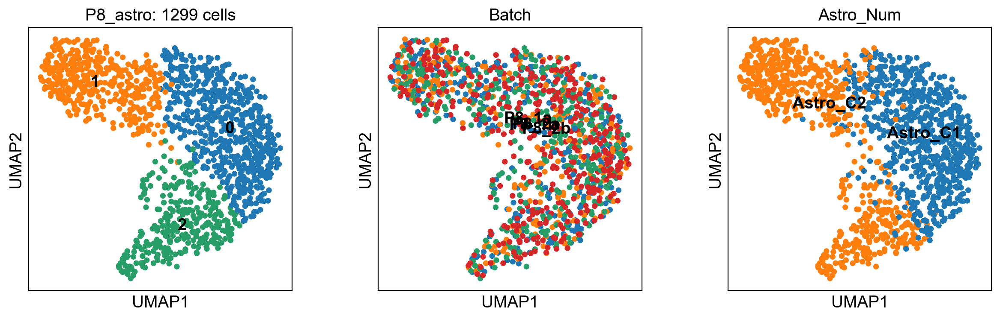

In [21]:
sc.tl.leiden(P8_astro, resolution=0.5)
sc.pl.umap(P8_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P8_astro: ' + str(P8_astro.shape[0]) + ' cells', 'Batch'], legend_loc='on data')

P8_astro = P8_astro[P8_astro.obs.leiden!='7',:]

P8_astro = P8_astro[P8_astro.obs.leiden!='6',:]

P8_astro = P8_astro[P8_astro.obs.leiden!='6',:]
P8_astro = P8_astro[P8_astro.obs.leiden!='7',:]
P8_astro = P8_astro[P8_astro.obs.leiden!='8',:]
P8_astro = P8_astro[P8_astro.obs.leiden!='9',:]
P8_astro = P8_astro[P8_astro.obs.leiden!='10',:]

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


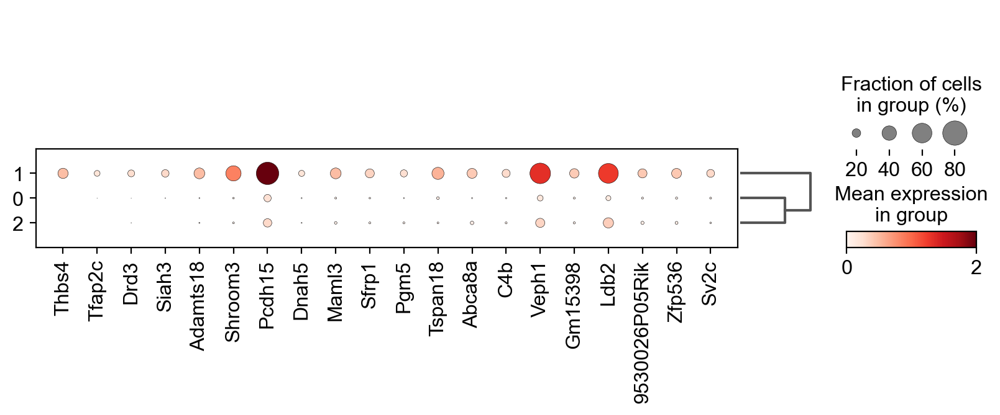

['Thbs4', 'Tfap2c', 'Drd3', 'Siah3', 'Adamts18', 'Shroom3']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


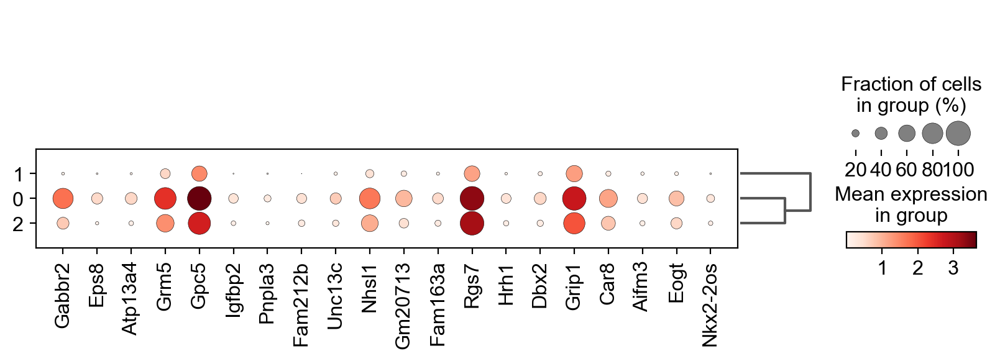

['Gabbr2', 'Eps8', 'Atp13a4', 'Grm5', 'Gpc5', 'Igfbp2']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


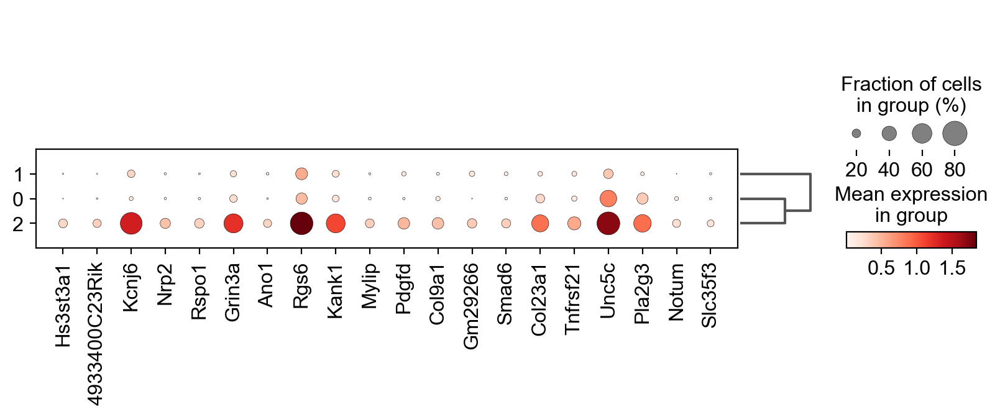

['Hs3st3a1', '4933400C23Rik', 'Kcnj6', 'Nrp2', 'Rspo1', 'Grin3a']


In [22]:
sc.tl.dendrogram(P8_astro, groupby='leiden', use_rep='X_harmony')
for i in P8_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P8_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P8_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P8_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P8_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P8_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P8_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## P14_astro

In [31]:
'''
P14_astro = P14[P14.obs.leiden=='11',:].concatenate(P14[P14.obs.leiden=='0',:],
                                                  P14[P14.obs.leiden=='3',:],)

P14_astro_clust = []
for i in range(P14_astro.shape[0]):
    if ( int(P14_astro.obs.leiden[i]) in (0, 11) ): P14_astro_clust.append('Astro_C1')
    elif ( int(P14_astro.obs.leiden[i]) in (3, 6776) ): P14_astro_clust.append('Astro_C2')

P14_astro.obs['Astro_Num'] = P14_astro.obs['leiden']
P14_astro.obs['Astro_Num'] = pd.Series(P14_astro_clust, dtype='category').values
'''

del P14_astro.obsp
del P14_astro.varm
del P14_astro.obsm
del P14_astro.uns


P14_astro.X = P14_astro.raw.X
sc.pp.highly_variable_genes(P14_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P14_astro, max_value=10) #scale
sc.tl.pca(P14_astro, svd_solver='arpack') #run PCA

Z = harmonize(P14_astro.obsm['X_pca'], P14_astro.obs, batch_key = 'sample')
P14_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P14_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P14_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P14_astro)
sc.tl.umap(P14_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: 

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


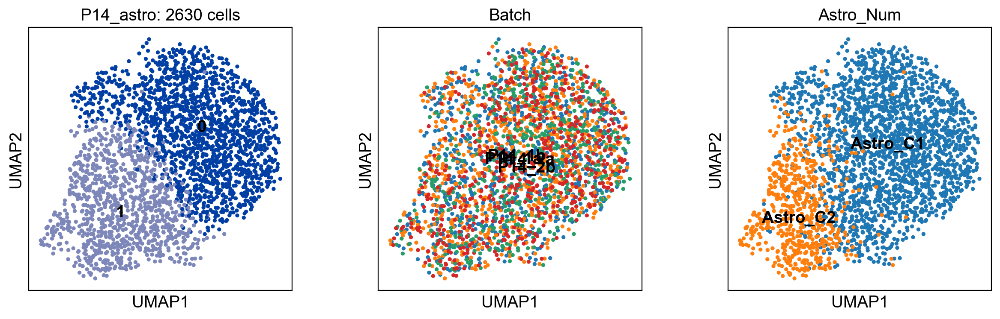

In [46]:
sc.tl.leiden(P14_astro, resolution=0.4)
sc.pl.umap(P14_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P14_astro: ' + str(P14_astro.shape[0]) + ' cells', 'Batch'], 
           legend_loc='on data')

P14_astro = P14_astro[P14_astro.obs.leiden!='6',:]

P14_astro = P14_astro[P14_astro.obs.leiden!='7',:]
P14_astro = P14_astro[P14_astro.obs.leiden!='8',:]
P14_astro = P14_astro[P14_astro.obs.leiden!='9',:]
P14_astro = P14_astro[P14_astro.obs.leiden!='10',:]

2 clusters was the optimal in terms of DE markers. And these 2 clusters correspond to Astro_C1 and C2 very well.

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


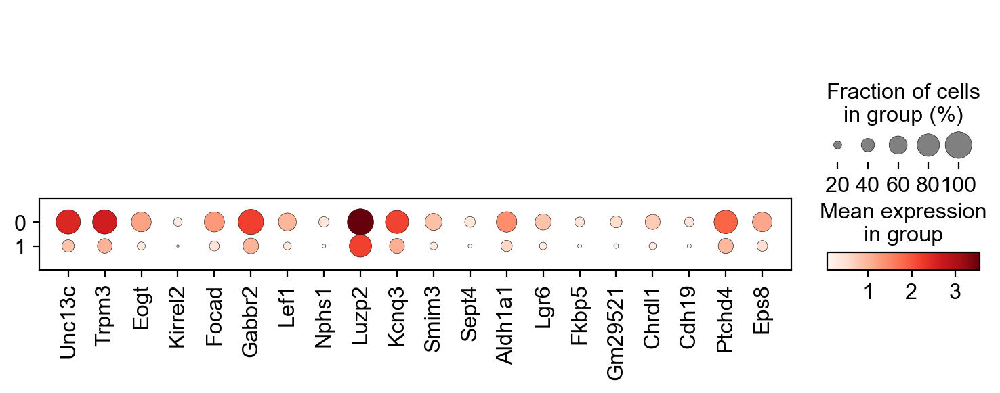

['Unc13c', 'Trpm3', 'Eogt', 'Kirrel2', 'Focad', 'Gabbr2']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


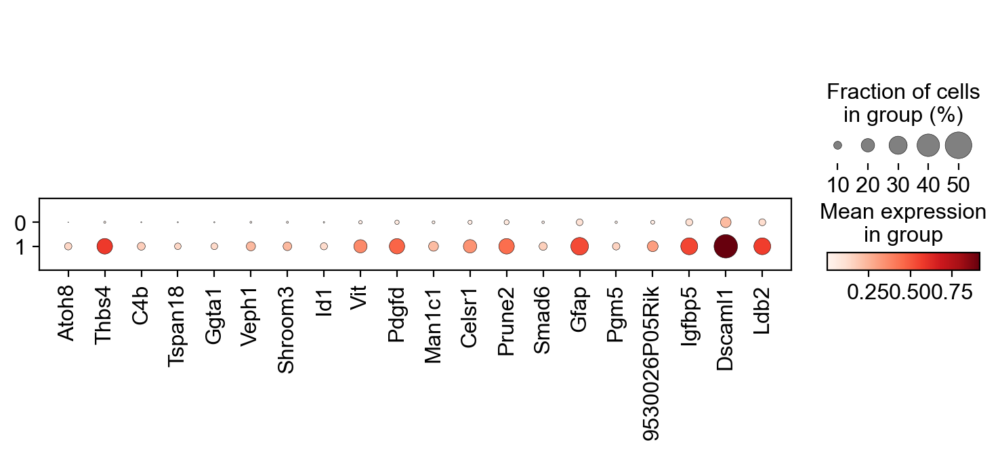

['Atoh8', 'Thbs4', 'C4b', 'Tspan18', 'Ggta1', 'Veph1']


In [43]:
sc.tl.dendrogram(P14_astro, groupby='leiden', use_rep='X_harmony')

for i in P14_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P14_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P14_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P14_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P14_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P14_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P14_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## P17_astro

In [47]:
P17_astro = P17[P17.obs.leiden=='0',:].concatenate(P17[P17.obs.leiden=='4',:])

P17_astro_clust = []
for i in range(P17_astro.shape[0]):
    if ( int(P17_astro.obs.leiden[i]) in (0, 4242) ): P17_astro_clust.append('Astro_C1')
    elif ( int(P17_astro.obs.leiden[i]) in (4, 4242) ): P17_astro_clust.append('Astro_C2')

P17_astro.obs['Astro_Num'] = P17_astro.obs['leiden']
P17_astro.obs['Astro_Num'] = pd.Series(P17_astro_clust, dtype='category').values

del P17_astro.obsp
del P17_astro.varm
del P17_astro.obsm
del P17_astro.uns


P17_astro.X = P17_astro.raw.X
sc.pp.highly_variable_genes(P17_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P17_astro, max_value=10) #scale
sc.tl.pca(P17_astro, svd_solver='arpack') #run PCA

Z = harmonize(P17_astro.obsm['X_pca'], P17_astro.obs, batch_key = 'sample')
P17_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P17_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P17_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P17_astro)
sc.tl.umap(P17_astro)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


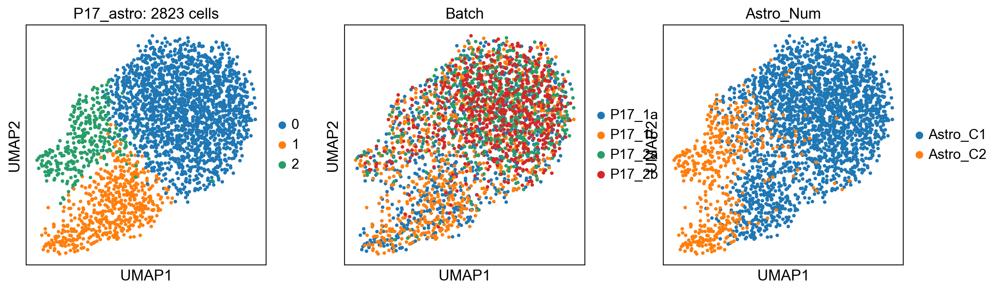

In [54]:
sc.tl.leiden(P17_astro, resolution=0.5)
sc.pl.umap(P17_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P17_astro: ' + str(P17_astro.shape[0]) + ' cells', 'Batch'])

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


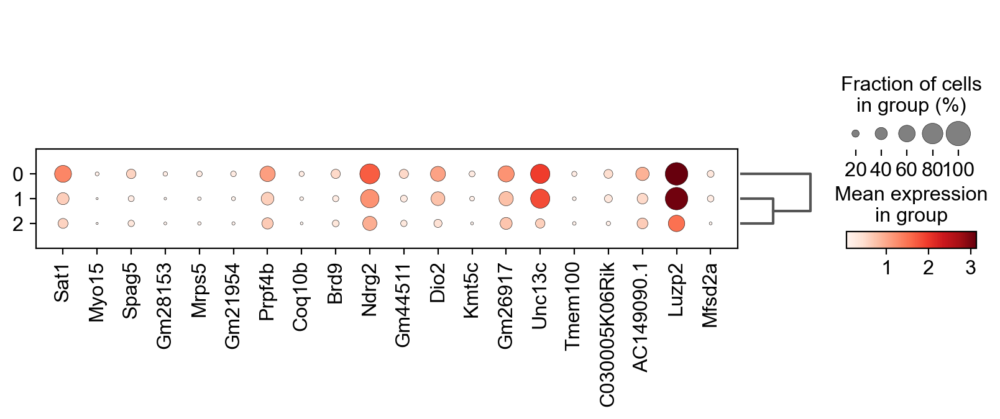

['Sat1', 'Myo15', 'Spag5', 'Gm28153', 'Mrps5', 'Gm21954']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


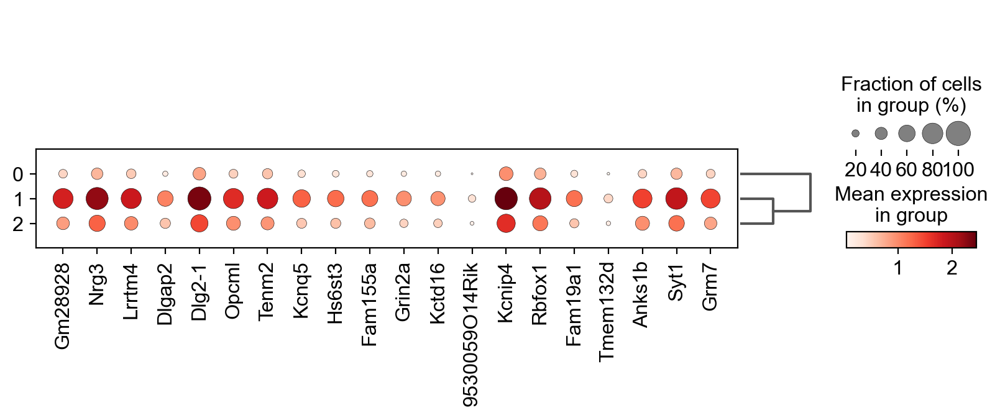

['Gm28928', 'Nrg3', 'Lrrtm4', 'Dlgap2', 'Dlg2-1', 'Opcml']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


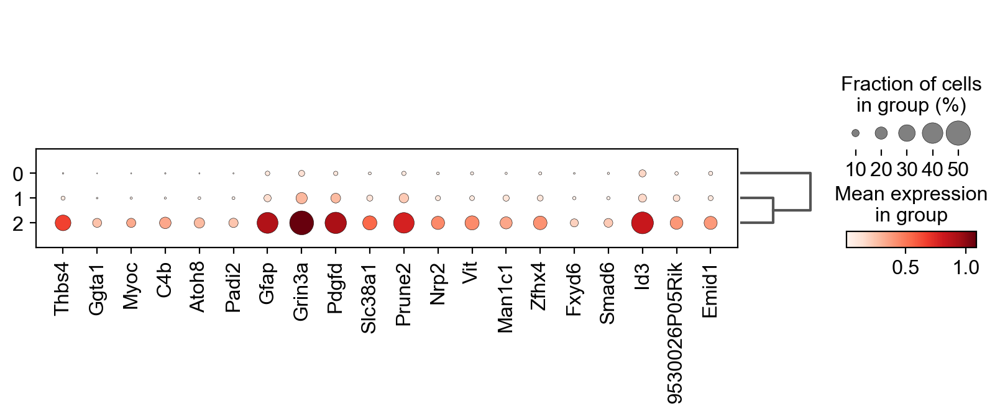

['Thbs4', 'Ggta1', 'Myoc', 'C4b', 'Atoh8', 'Padi2']


In [55]:
sc.tl.dendrogram(P17_astro, groupby='leiden', use_rep='X_harmony')

for i in P17_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P17_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P17_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P17_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P17_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P17_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P17_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## P21_astro

In [65]:
'''
P21_astro = P21[P21.obs.leiden=='0',:].concatenate(P21[P21.obs.leiden=='4',:])

P21_astro_clust = []
for i in range(P21_astro.shape[0]):
    if ( int(P21_astro.obs.leiden[i]) in (0, 4242) ): P21_astro_clust.append('Astro_C1')
    elif ( int(P21_astro.obs.leiden[i]) in (4, 4242) ): P21_astro_clust.append('Astro_C2')

P21_astro.obs['Astro_Num'] = P21_astro.obs['leiden']
P21_astro.obs['Astro_Num'] = pd.Series(P21_astro_clust, dtype='category').values
'''

del P21_astro.obsp
del P21_astro.varm
del P21_astro.obsm
del P21_astro.uns


P21_astro.X = P21_astro.raw.X
sc.pp.highly_variable_genes(P21_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P21_astro, max_value=10) #scale
sc.tl.pca(P21_astro, svd_solver='arpack') #run PCA

Z = harmonize(P21_astro.obsm['X_pca'], P21_astro.obs, batch_key = 'sample')
P21_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P21_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P21_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P21_astro)
sc.tl.umap(P21_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: 

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


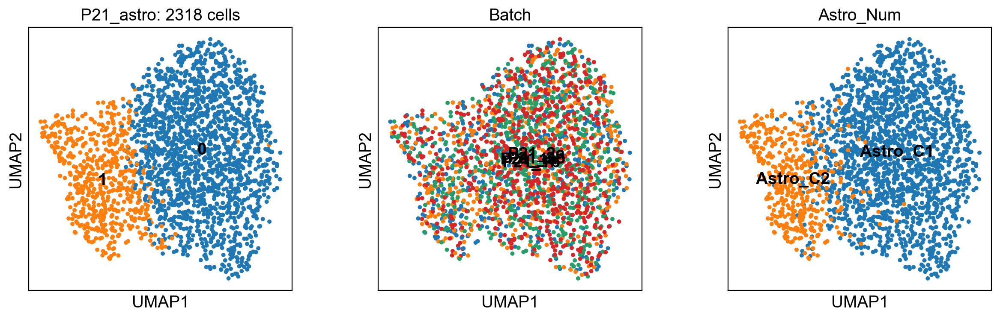

In [70]:
sc.tl.leiden(P21_astro, resolution=0.5)
sc.pl.umap(P21_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P21_astro: ' + str(P21_astro.shape[0]) + ' cells', 'Batch'], 
          legend_loc='on data')

P21_astro = P21_astro[P21_astro.obs.leiden!='2',:]

P21_astro = P21_astro[P21_astro.obs.leiden!='7',:]
P21_astro = P21_astro[P21_astro.obs.leiden!='8',:]
P21_astro = P21_astro[P21_astro.obs.leiden!='9',:]
P21_astro = P21_astro[P21_astro.obs.leiden!='10',:]
P21_astro = P21_astro[P21_astro.obs.leiden!='11',:]
P21_astro = P21_astro[P21_astro.obs.leiden!='12',:]

Marker wise, there are only 2 clusters and they correspond exactly to Astro_C1 and C2.

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


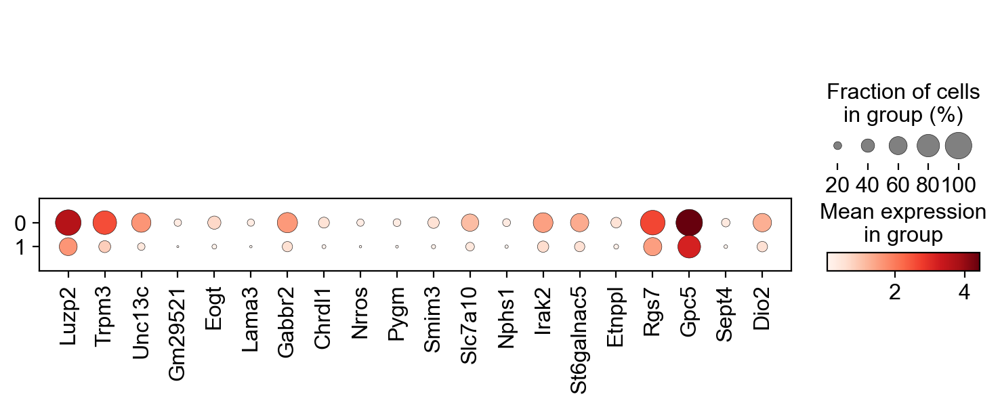

['Luzp2', 'Trpm3', 'Unc13c', 'Gm29521', 'Eogt', 'Lama3']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


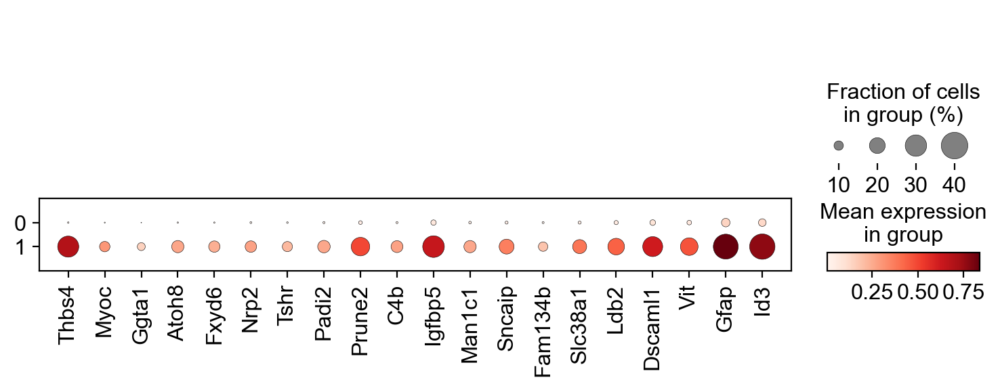

['Thbs4', 'Myoc', 'Ggta1', 'Atoh8', 'Fxyd6', 'Nrp2']


In [71]:
sc.tl.dendrogram(P21_astro, groupby='leiden', use_rep='X_harmony')

for i in P21_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P21_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P21_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P21_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P21_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P21_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P21_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## P28_astro

In [93]:
'''
P28_astro = P28[P28.obs.leiden=='0',:].concatenate(P28[P28.obs.leiden=='4',:])

P28_astro_clust = []
for i in range(P28_astro.shape[0]):
    if ( int(P28_astro.obs.leiden[i]) in (0, 4242) ): P28_astro_clust.append('Astro_C1')
    elif ( int(P28_astro.obs.leiden[i]) in (4, 4242) ): P28_astro_clust.append('Astro_C2')

P28_astro.obs['Astro_Num'] = P28_astro.obs['leiden']
P28_astro.obs['Astro_Num'] = pd.Series(P28_astro_clust, dtype='category').values
'''

del P28_astro.obsp
del P28_astro.varm
del P28_astro.obsm
del P28_astro.uns


P28_astro.X = P28_astro.raw.X
sc.pp.highly_variable_genes(P28_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P28_astro, max_value=10) #scale
sc.tl.pca(P28_astro, svd_solver='arpack') #run PCA

Z = harmonize(P28_astro.obsm['X_pca'], P28_astro.obs, batch_key = 'sample')
P28_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P28_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P28_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P28_astro)
sc.tl.umap(P28_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP 

Marker wise, again, there are only 2 clusters and they correspond exactly to Astro_C1 and C2.

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


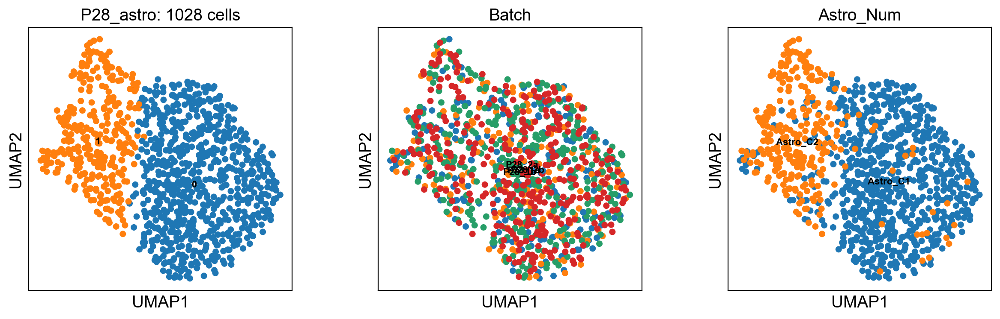

In [99]:
sc.tl.leiden(P28_astro, resolution=0.4)
sc.pl.umap(P28_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P28_astro: ' + str(P28_astro.shape[0]) + ' cells', 'Batch'],
          legend_loc='on data', legend_fontsize='8')

P28_astro = P28_astro[P28_astro.obs.leiden!='9',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='8',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='7',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='6',:]

P28_astro = P28_astro[P28_astro.obs.leiden!='4',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='6',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='5',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='10',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='7',:]

P28_astro = P28_astro[P28_astro.obs.leiden!='10',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='9',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='5',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='6',:]

P28_astro = P28_astro[P28_astro.obs.leiden!='7',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='8',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='9',:]

P28_astro = P28_astro[P28_astro.obs.leiden!='11',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='12',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='9',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='18',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='14',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='13',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='19',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='8',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='17',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='10',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='15',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='20',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='16',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='7',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='5',:]

P28_astro = P28_astro[P28_astro.obs.leiden!='13',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='14',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='16',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='10',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='6',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='15',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='11',:]
P28_astro = P28_astro[P28_astro.obs.leiden!='9',:]

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


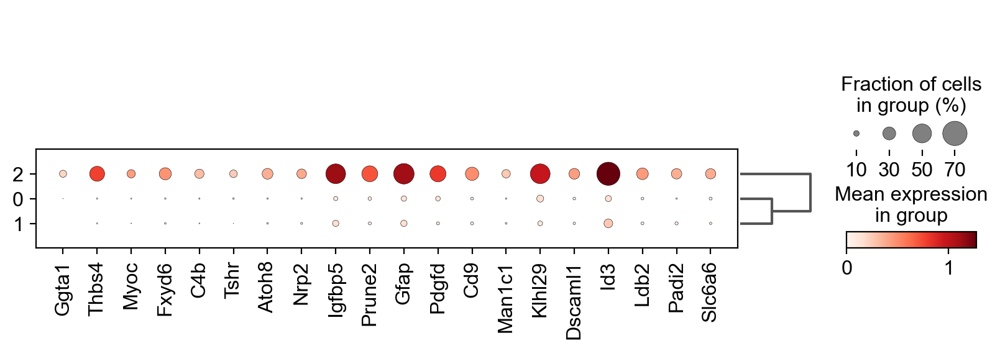

['Ggta1', 'Thbs4', 'Myoc', 'Fxyd6', 'C4b', 'Tshr']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


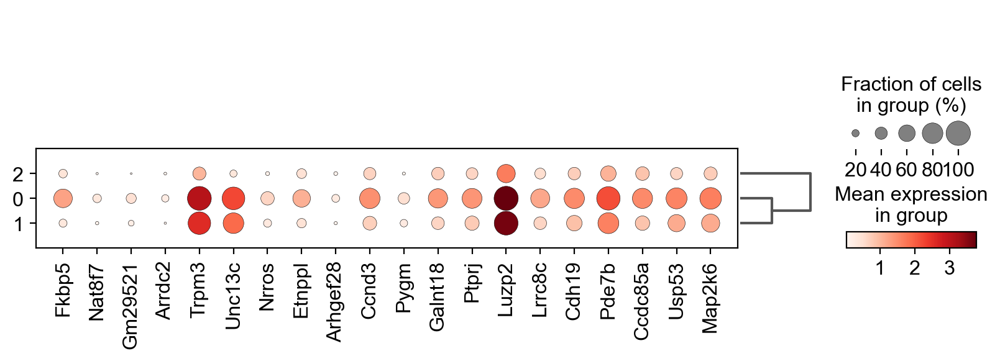

['Fkbp5', 'Nat8f7', 'Gm29521', 'Arrdc2', 'Trpm3', 'Unc13c']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


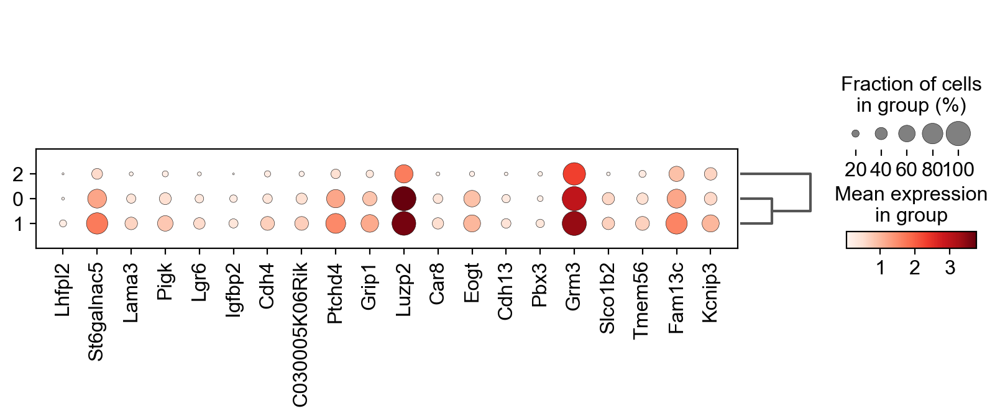

['Lhfpl2', 'St6galnac5', 'Lama3', 'Pigk', 'Lgr6', 'Igfbp2']


In [98]:
sc.tl.dendrogram(P28_astro, groupby='leiden', use_rep='X_harmony')

for i in P28_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P28_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P28_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P28_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P28_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P28_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P28_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

## P38_astro

In [122]:
'''
P38_astro = P38[P38.obs.leiden=='0',:].concatenate(P38[P38.obs.leiden=='7',:])

P38_astro_clust = []
for i in range(P38_astro.shape[0]):
    if ( int(P38_astro.obs.leiden[i]) in (0, 4242) ): P38_astro_clust.append('Astro_C1')
    elif ( int(P38_astro.obs.leiden[i]) in (7, 4242) ): P38_astro_clust.append('Astro_C2')

P38_astro.obs['Astro_Num'] = P38_astro.obs['leiden']
P38_astro.obs['Astro_Num'] = pd.Series(P38_astro_clust, dtype='category').values
'''

del P38_astro.obsp
del P38_astro.varm
del P38_astro.obsm
del P38_astro.uns


P38_astro.X = P38_astro.raw.X
sc.pp.highly_variable_genes(P38_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P38_astro, max_value=10) #scale
sc.tl.pca(P38_astro, svd_solver='arpack') #run PCA

Z = harmonize(P38_astro.obsm['X_pca'], P38_astro.obs, batch_key = 'sample')
P38_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P38_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P38_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P38_astro)
sc.tl.umap(P38_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matri

running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


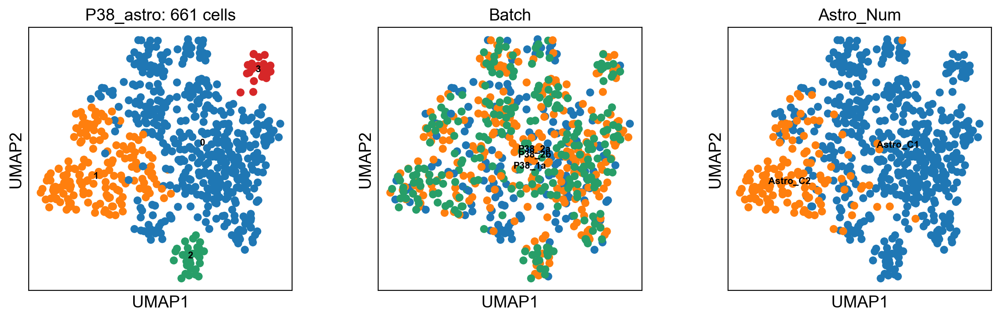

In [129]:
sc.tl.leiden(P38_astro, resolution=0.3)
sc.pl.umap(P38_astro, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P38_astro: ' + str(P38_astro.shape[0]) + ' cells', 'Batch', 'Astro_Num'],
          legend_loc='on data', legend_fontsize='8')

Again 2 clusters corresponding to C1 and C2. 

P38_astro = P38_astro[P38_astro.obs.leiden!='5',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='7',:]

P38_astro = P38_astro[P38_astro.obs.leiden!='7',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='10',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='14',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='16',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='11',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='8',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='13',:]
P38_astro = P38_astro[P38_astro.obs.leiden!='6',:]

In [114]:
for i in P38_astro.obs['leiden'].values.categories:
    print(i, ': ', P38_astro[P38_astro.obs.leiden==i,:].shape[0])
    if (int(i)>3):
        P38_astro = P38_astro[P38_astro.obs.leiden!=i,:]
        print('removed', i)

0 :  415
1 :  284
2 :  136
3 :  130
4 :  46
removed 4
5 :  38
removed 5
6 :  37
removed 6
7 :  36
removed 7
8 :  34
removed 8
9 :  34
removed 9
10 :  33
removed 10
11 :  32
removed 11
12 :  28
removed 12
13 :  27
removed 13
14 :  27
removed 14
15 :  26
removed 15
16 :  25
removed 16
17 :  22
removed 17
18 :  21
removed 18
19 :  21
removed 19
20 :  18
removed 20
21 :  15
removed 21


Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


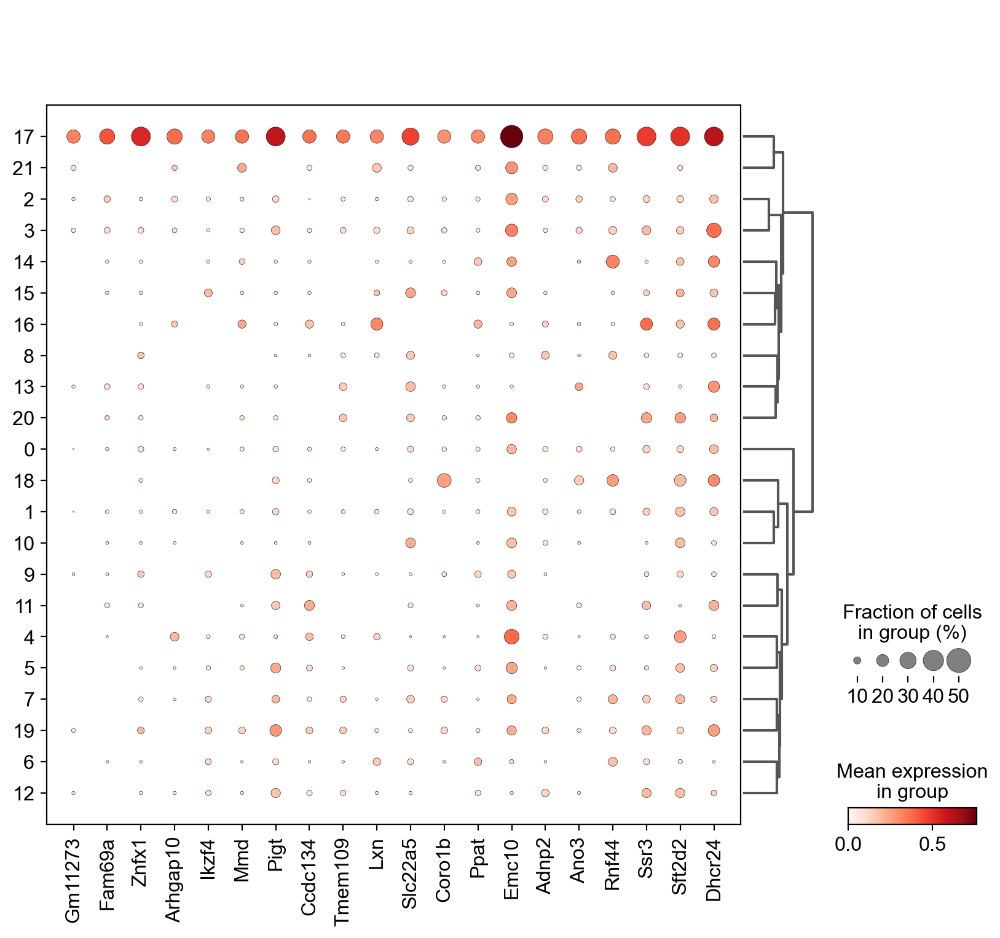

['Gm11273', 'Fam69a', 'Znfx1', 'Arhgap10', 'Ikzf4', 'Mmd']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


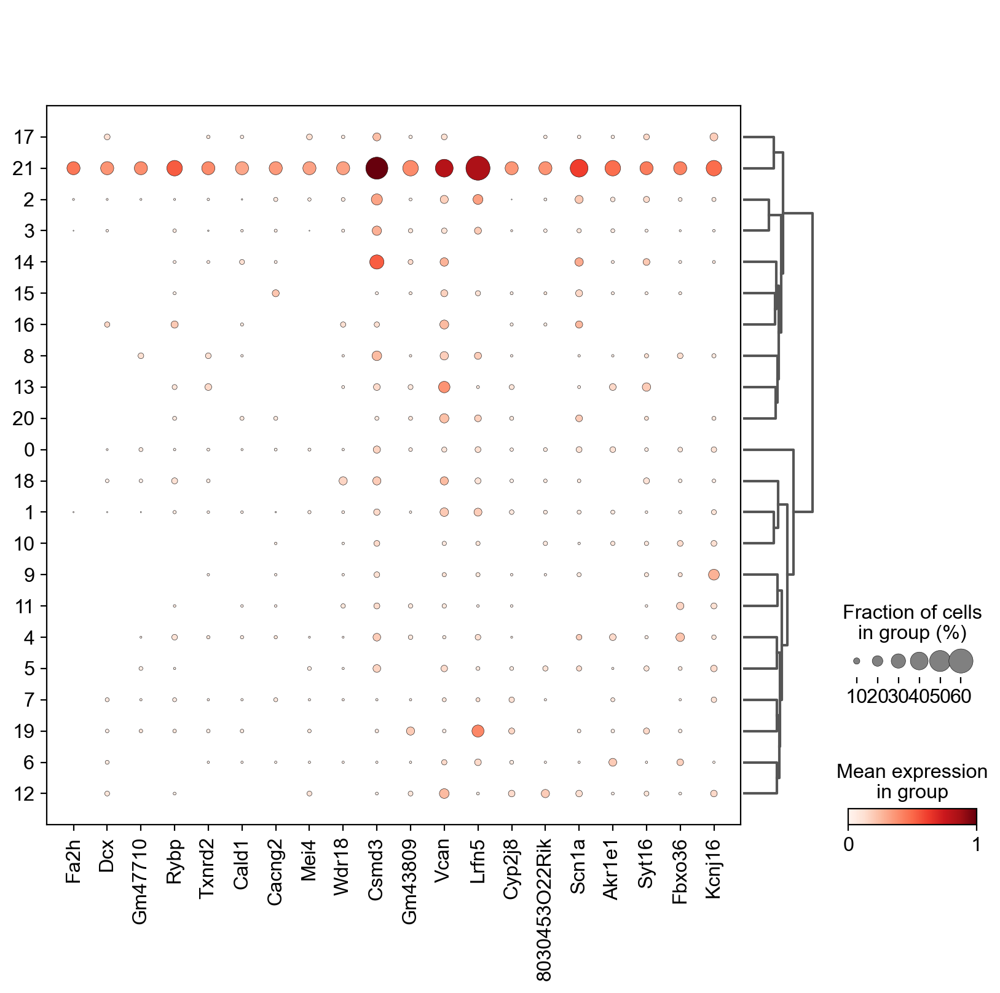

['Fa2h', 'Dcx', 'Gm47710', 'Rybp', 'Txnrd2', 'Cald1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


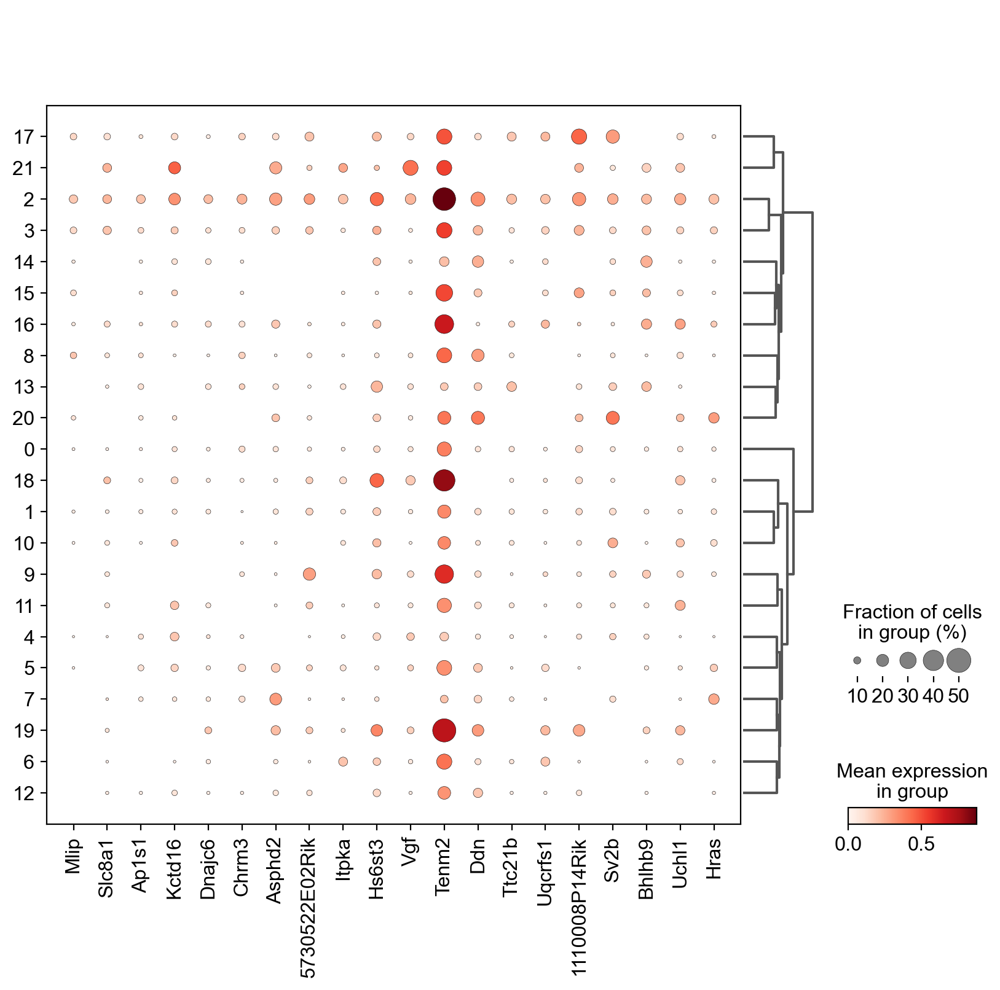

['Mlip', 'Slc8a1', 'Ap1s1', 'Kctd16', 'Dnajc6', 'Chrm3']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


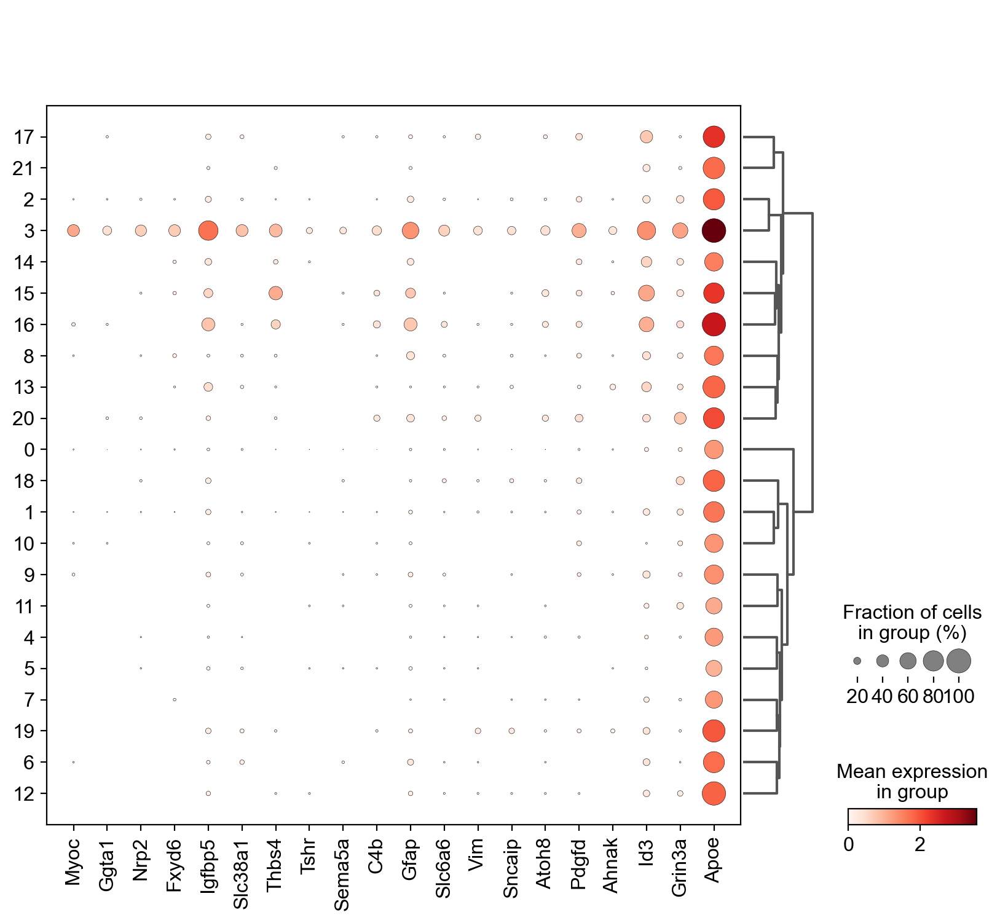

['Myoc', 'Ggta1', 'Nrp2', 'Fxyd6', 'Igfbp5', 'Slc38a1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


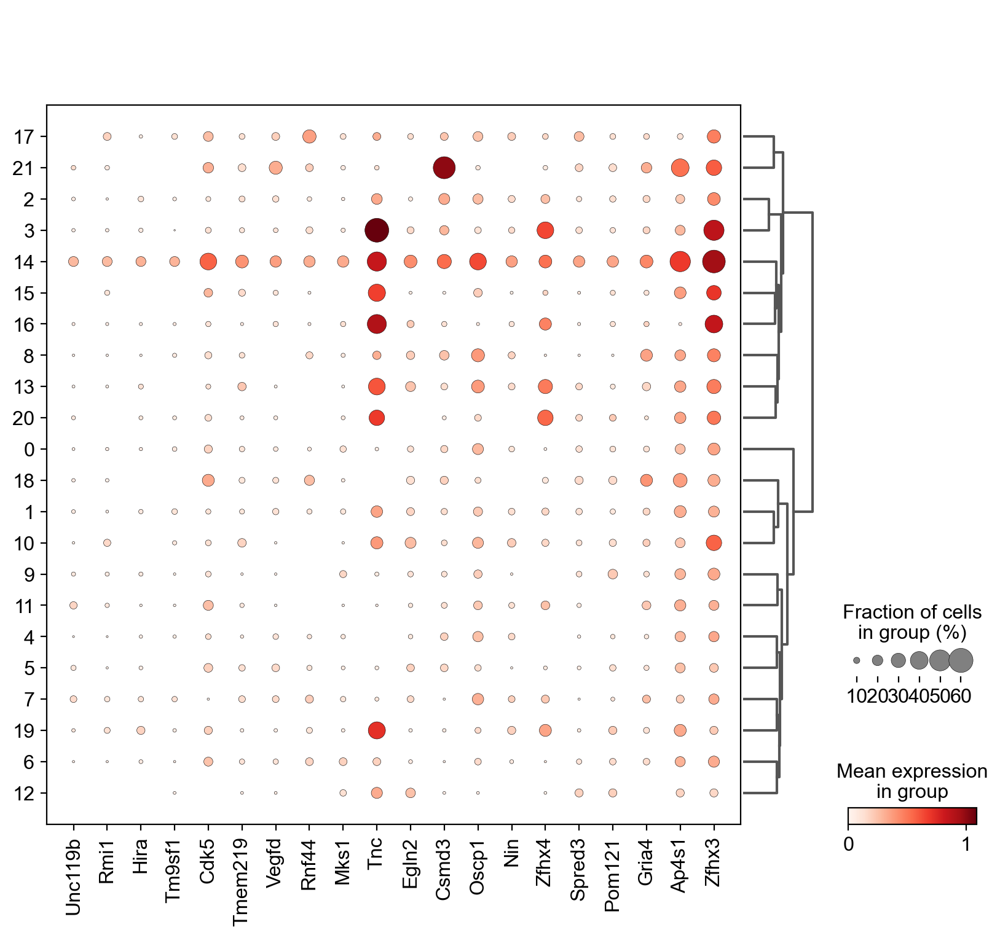

['Unc119b', 'Rmi1', 'Hira', 'Tm9sf1', 'Cdk5', 'Tmem219']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


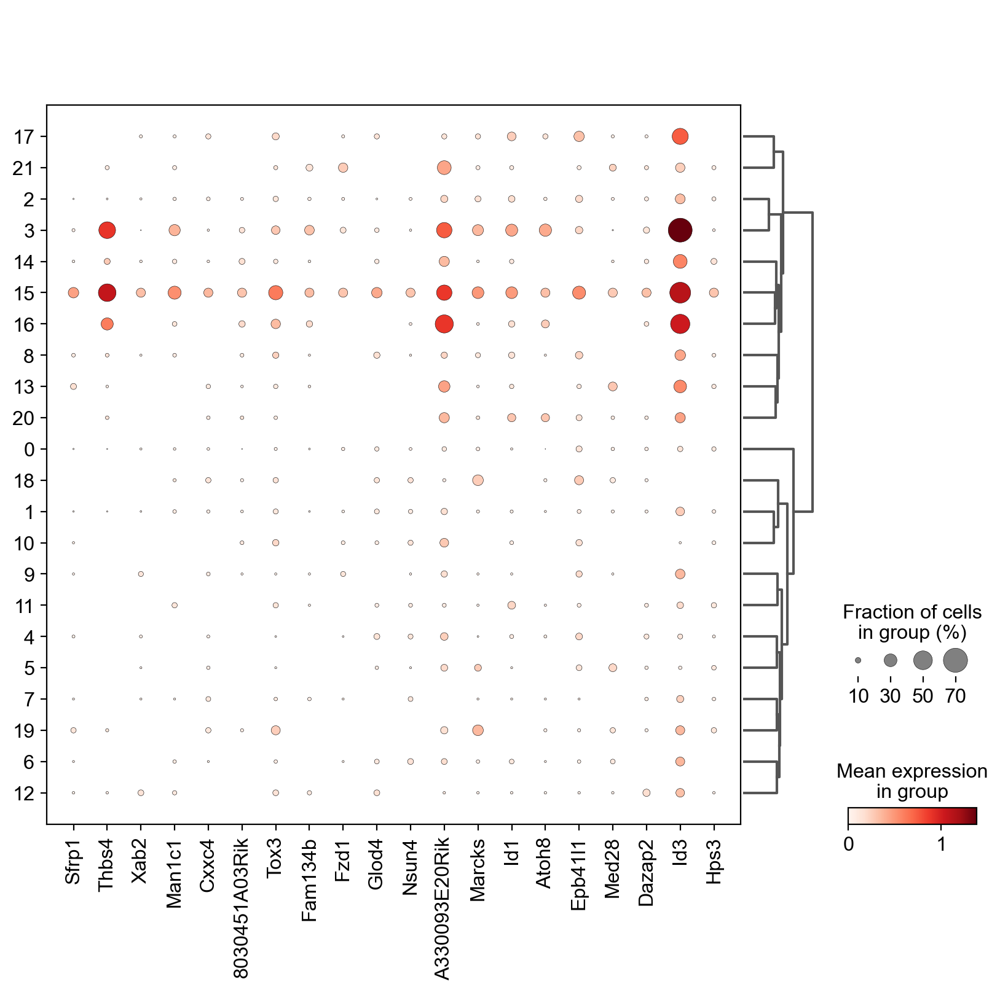

['Sfrp1', 'Thbs4', 'Xab2', 'Man1c1', 'Cxxc4', '8030451A03Rik']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


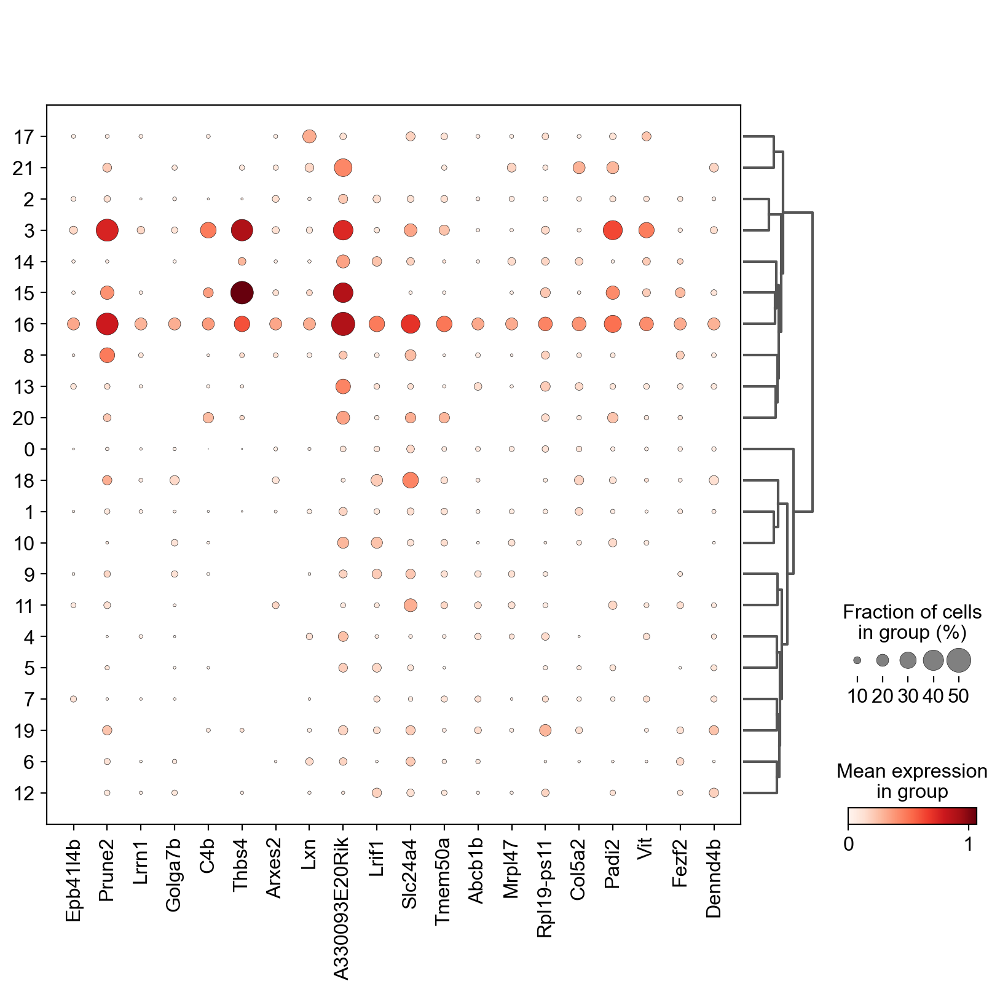

['Epb41l4b', 'Prune2', 'Lrrn1', 'Golga7b', 'C4b', 'Thbs4']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


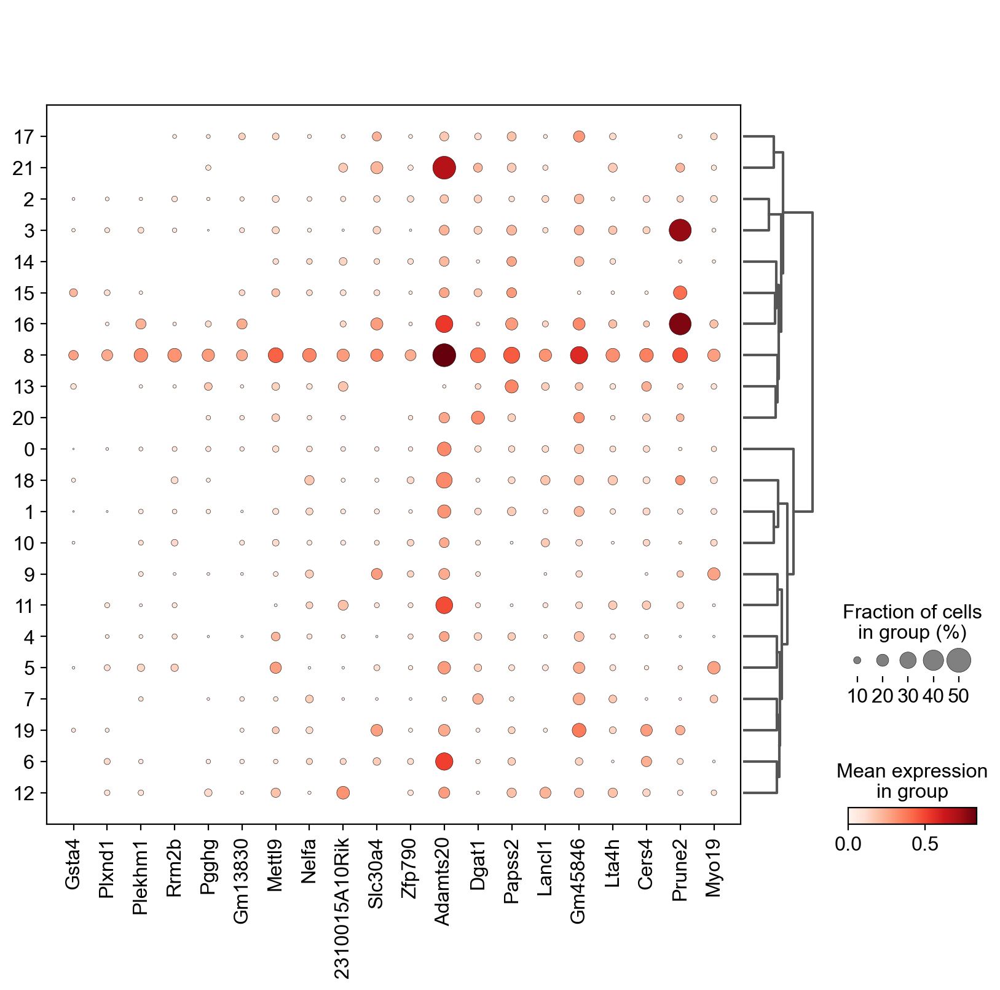

['Gsta4', 'Plxnd1', 'Plekhm1', 'Rrm2b', 'Pgghg', 'Gm13830']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


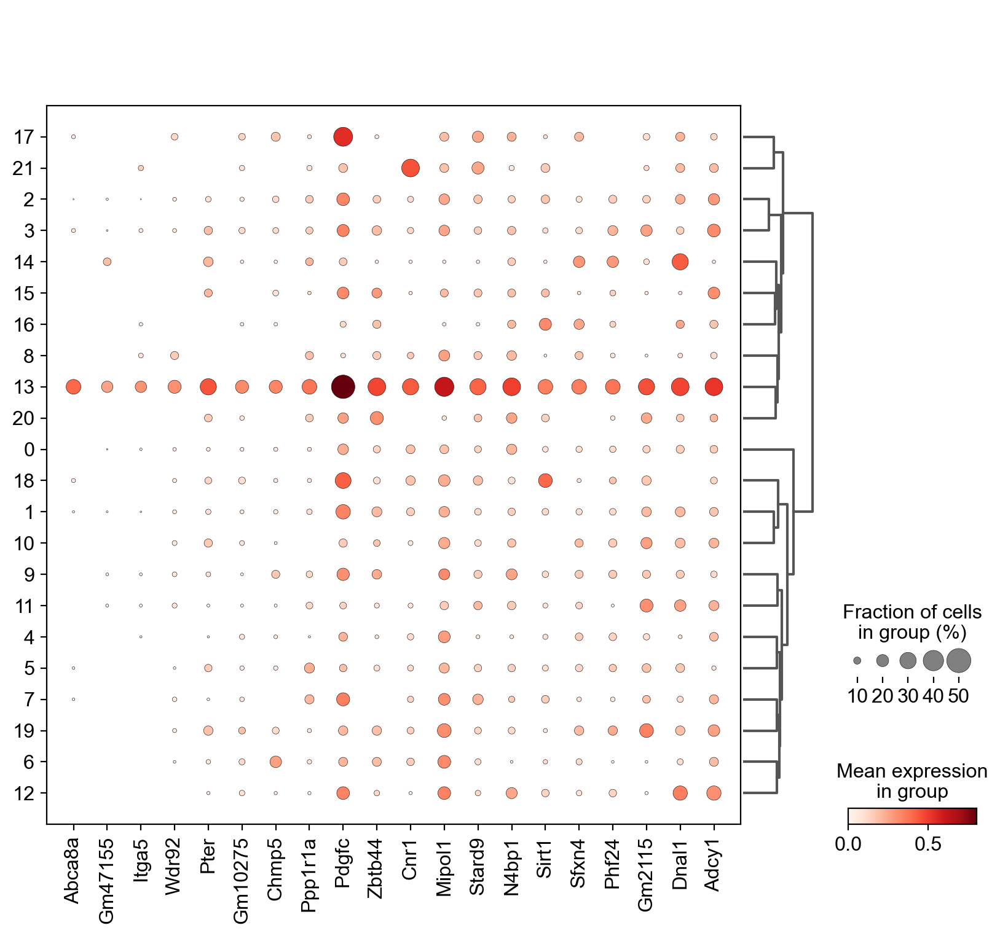

['Abca8a', 'Gm47155', 'Itga5', 'Wdr92', 'Pter', 'Gm10275']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


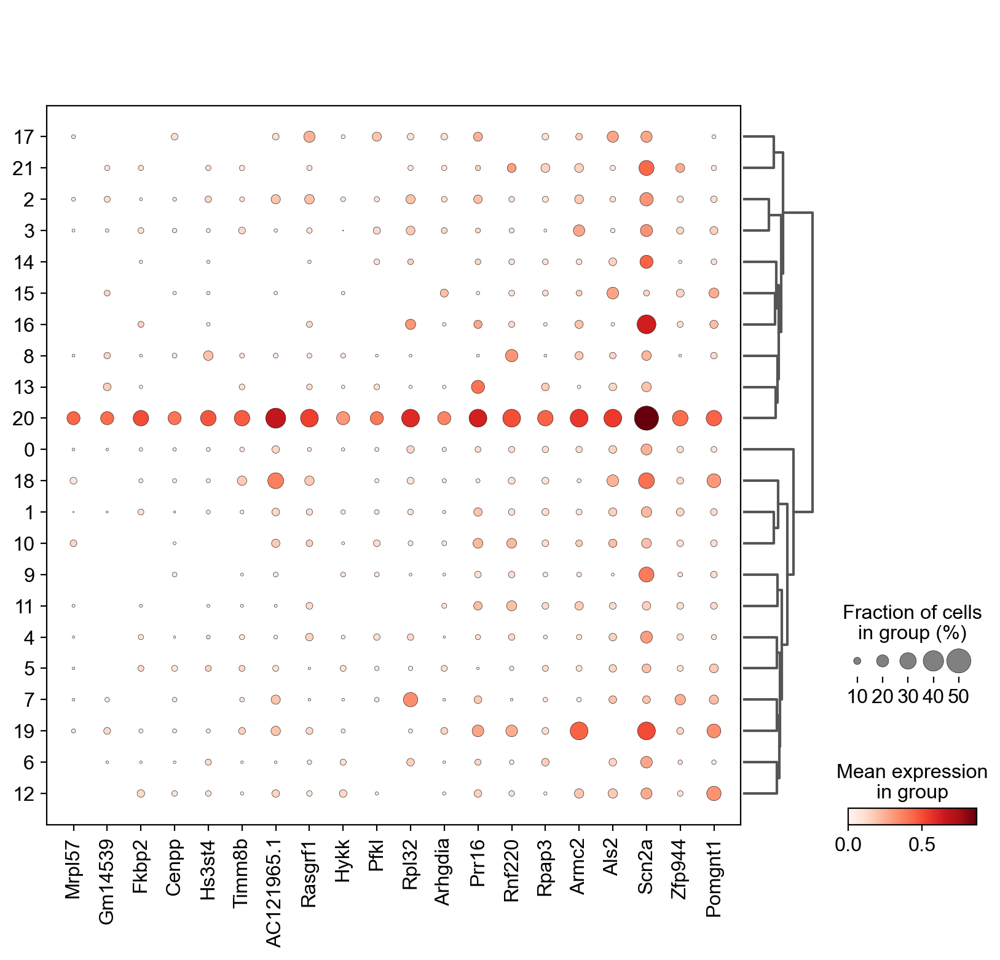

['Mrpl57', 'Gm14539', 'Fkbp2', 'Cenpp', 'Hs3st4', 'Timm8b']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


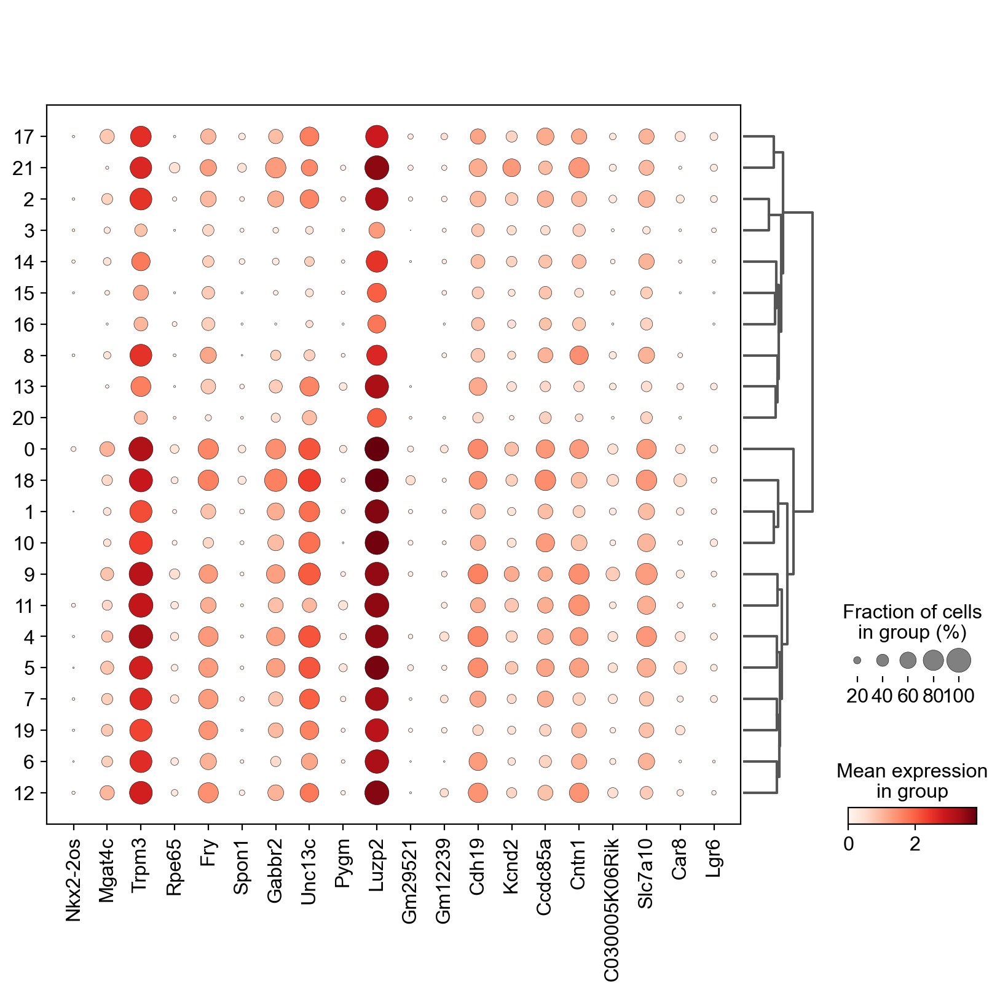

['Nkx2-2os', 'Mgat4c', 'Trpm3', 'Rpe65', 'Fry', 'Spon1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


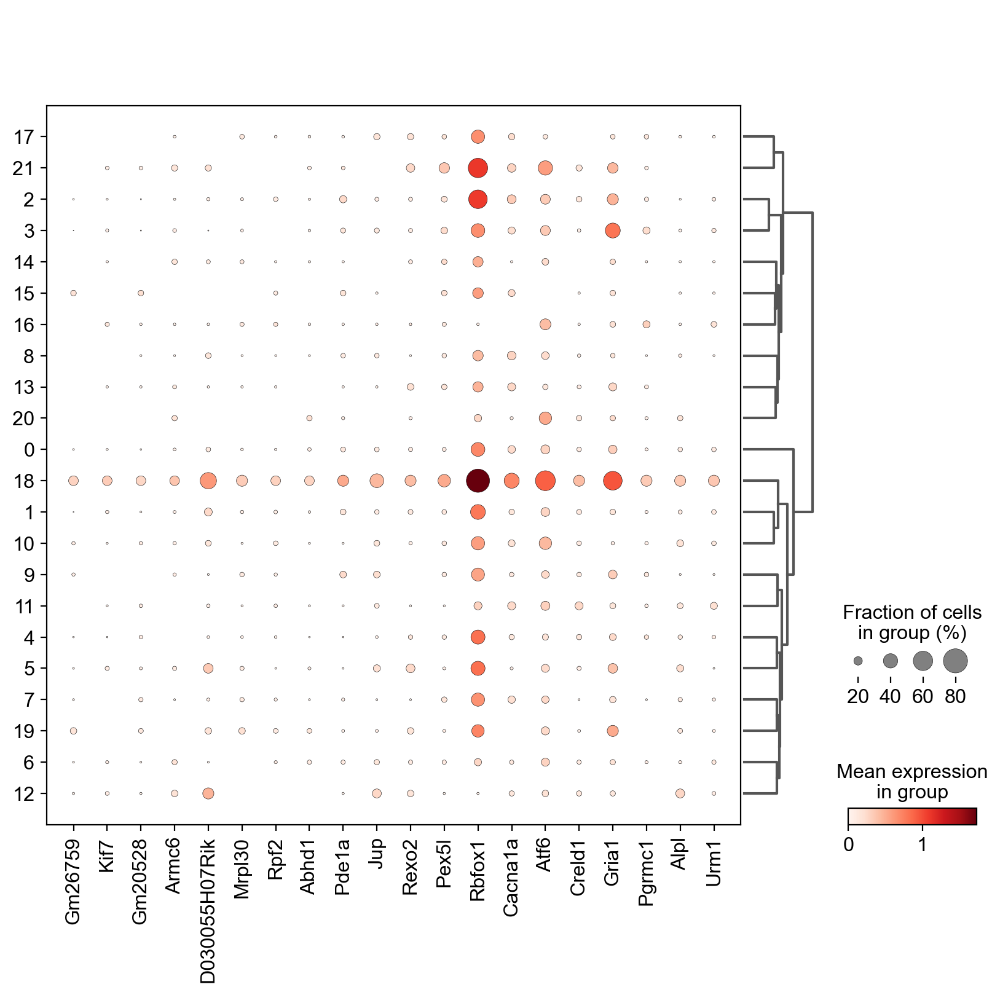

['Gm26759', 'Kif7', 'Gm20528', 'Armc6', 'D030055H07Rik', 'Mrpl30']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


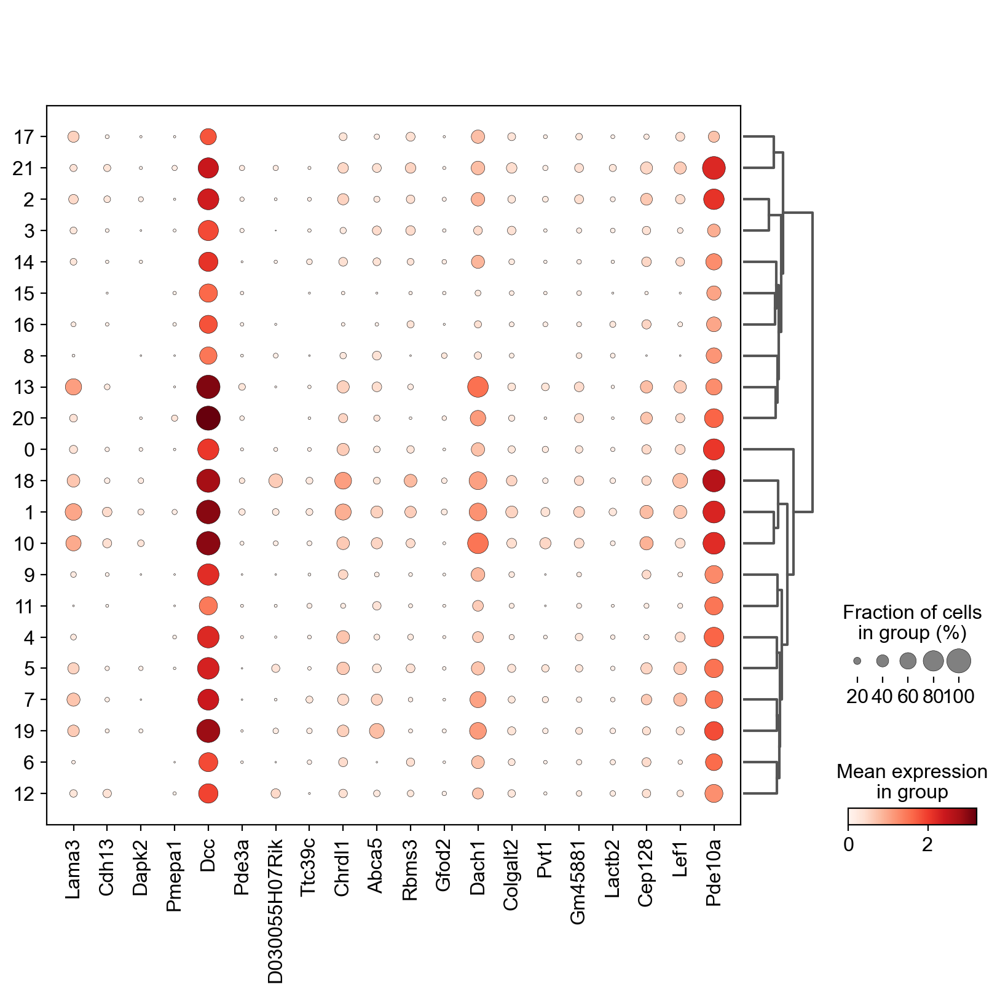

['Lama3', 'Cdh13', 'Dapk2', 'Pmepa1', 'Dcc', 'Pde3a']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


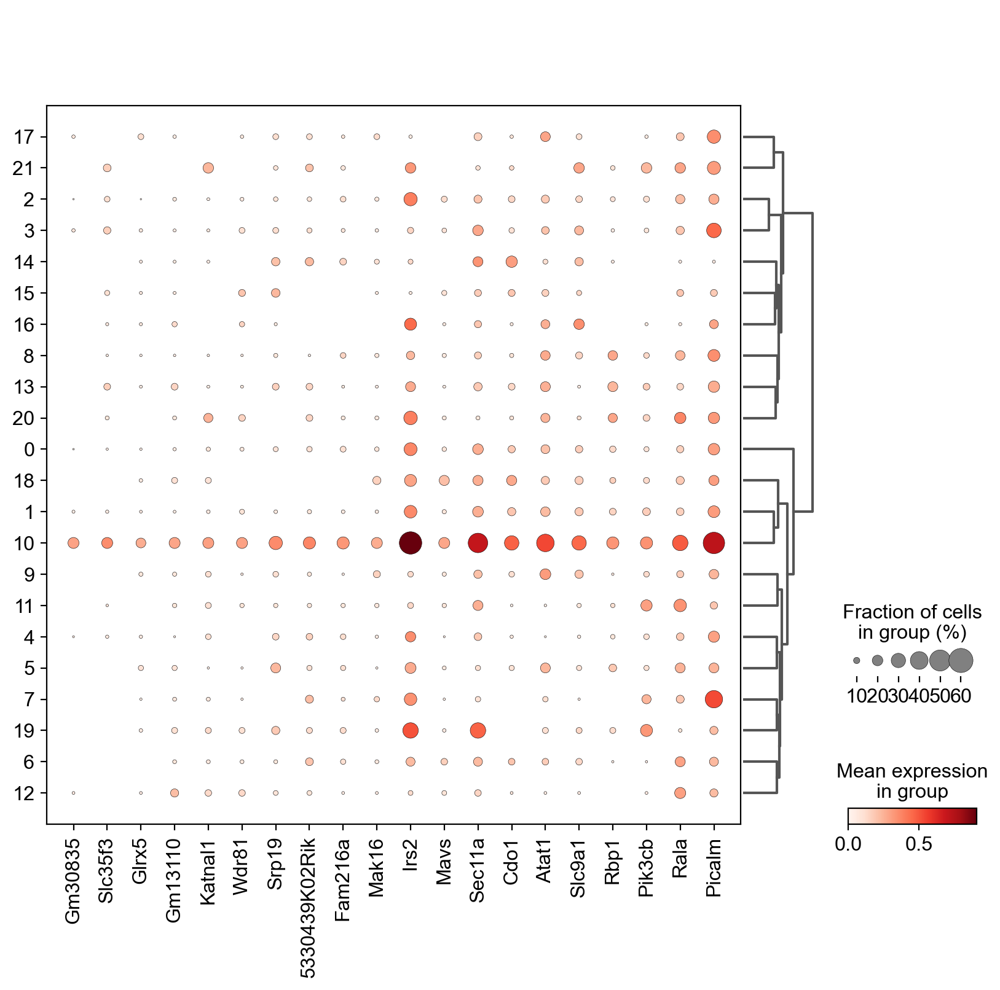

['Gm30835', 'Slc35f3', 'Glrx5', 'Gm13110', 'Katnal1', 'Wdr81']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


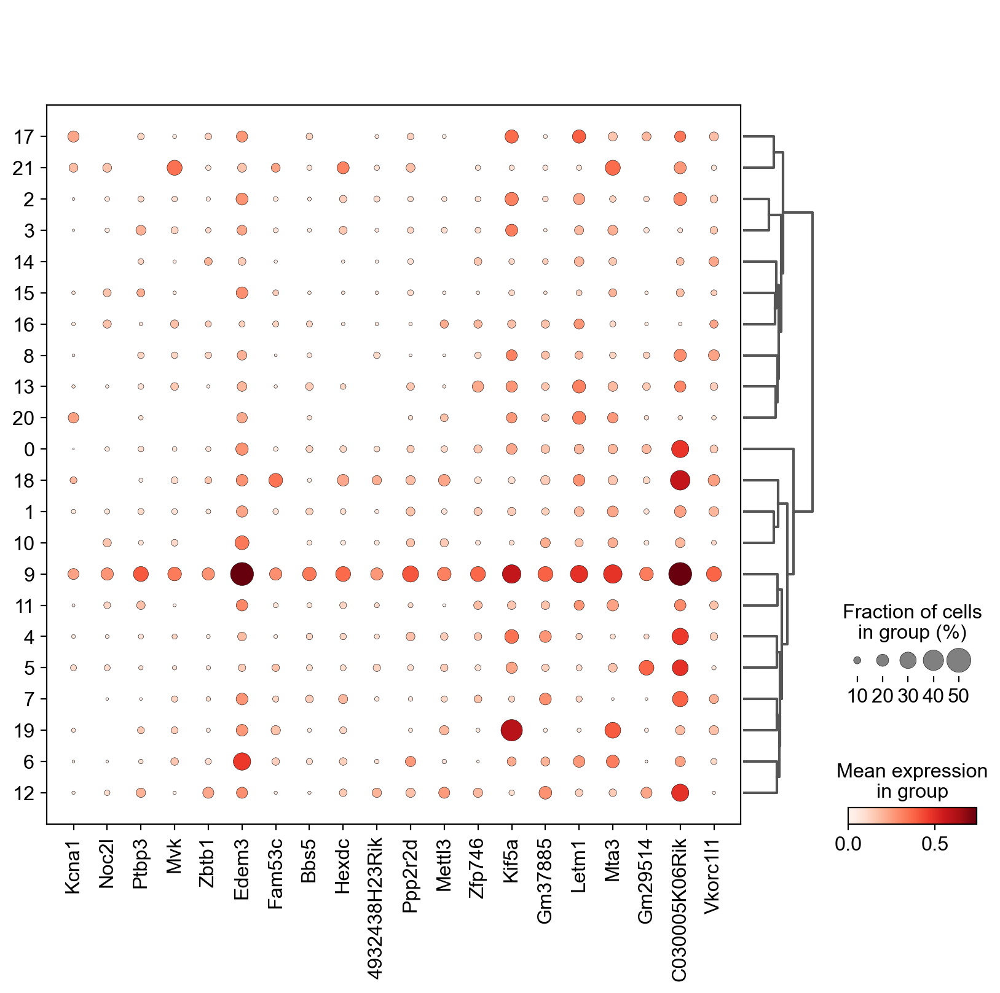

['Kcna1', 'Noc2l', 'Ptbp3', 'Mvk', 'Zbtb1', 'Edem3']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


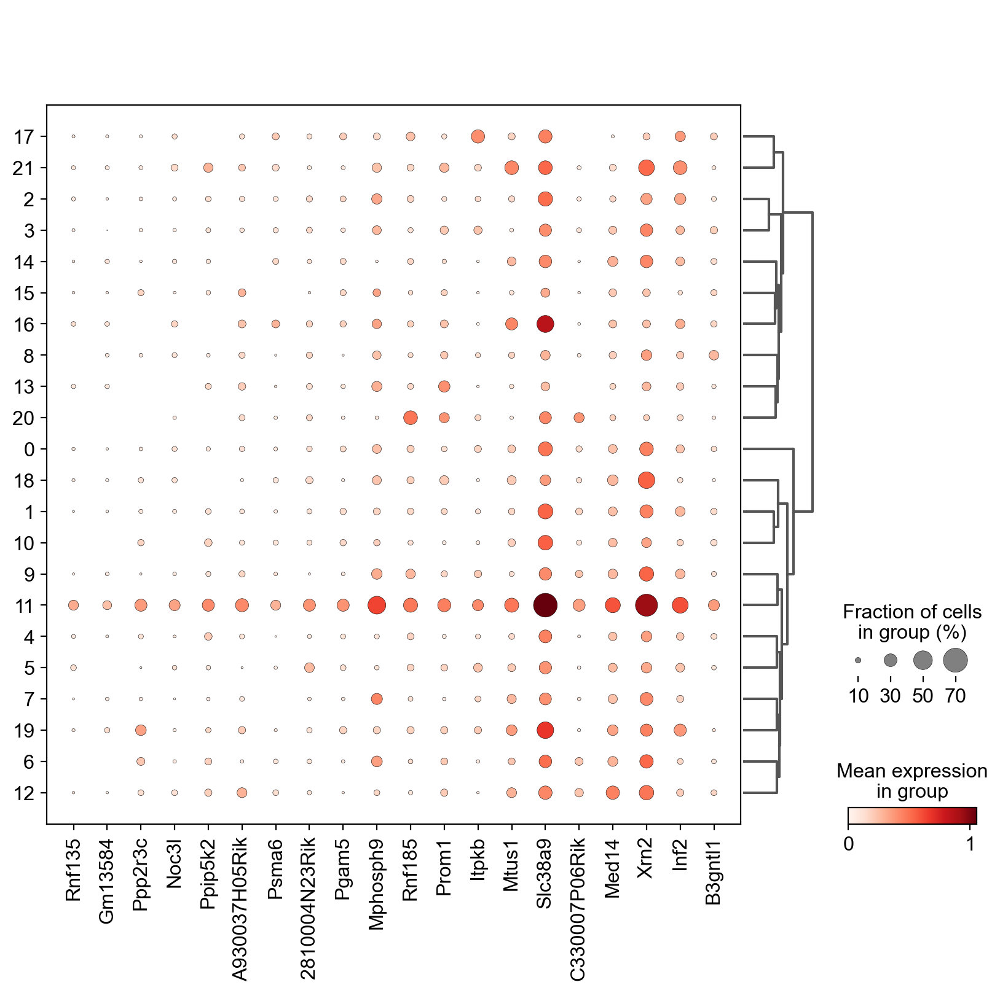

['Rnf135', 'Gm13584', 'Ppp2r3c', 'Noc3l', 'Ppip5k2', 'A930037H05Rik']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


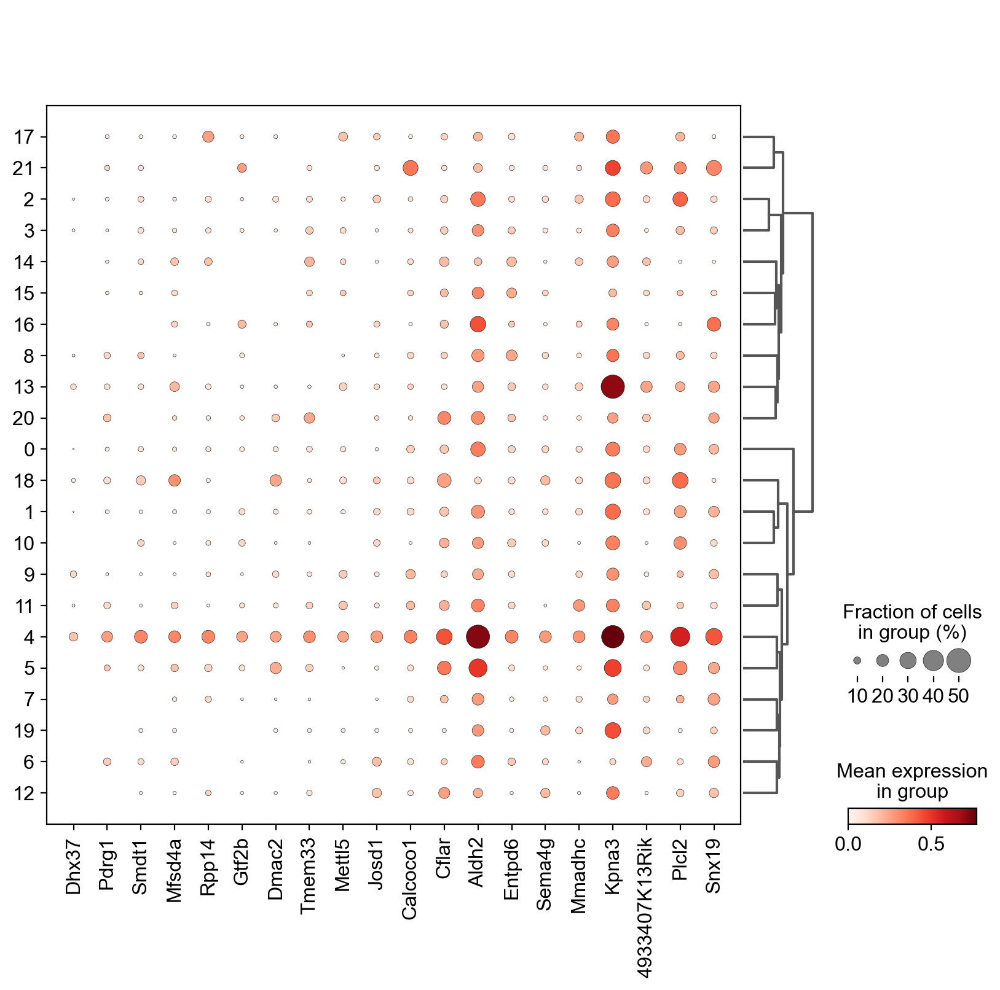

['Dhx37', 'Pdrg1', 'Smdt1', 'Mfsd4a', 'Rpp14', 'Gtf2b']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


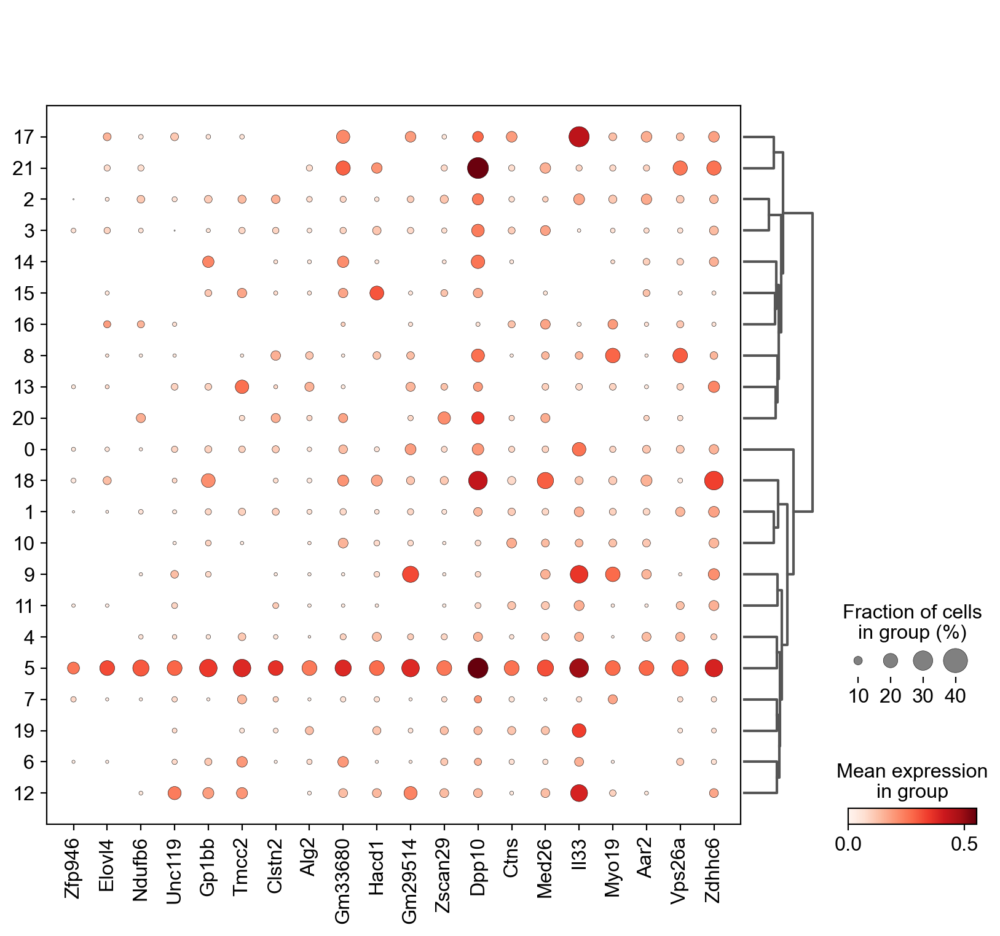

['Zfp946', 'Elovl4', 'Ndufb6', 'Unc119', 'Gp1bb', 'Tmcc2']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


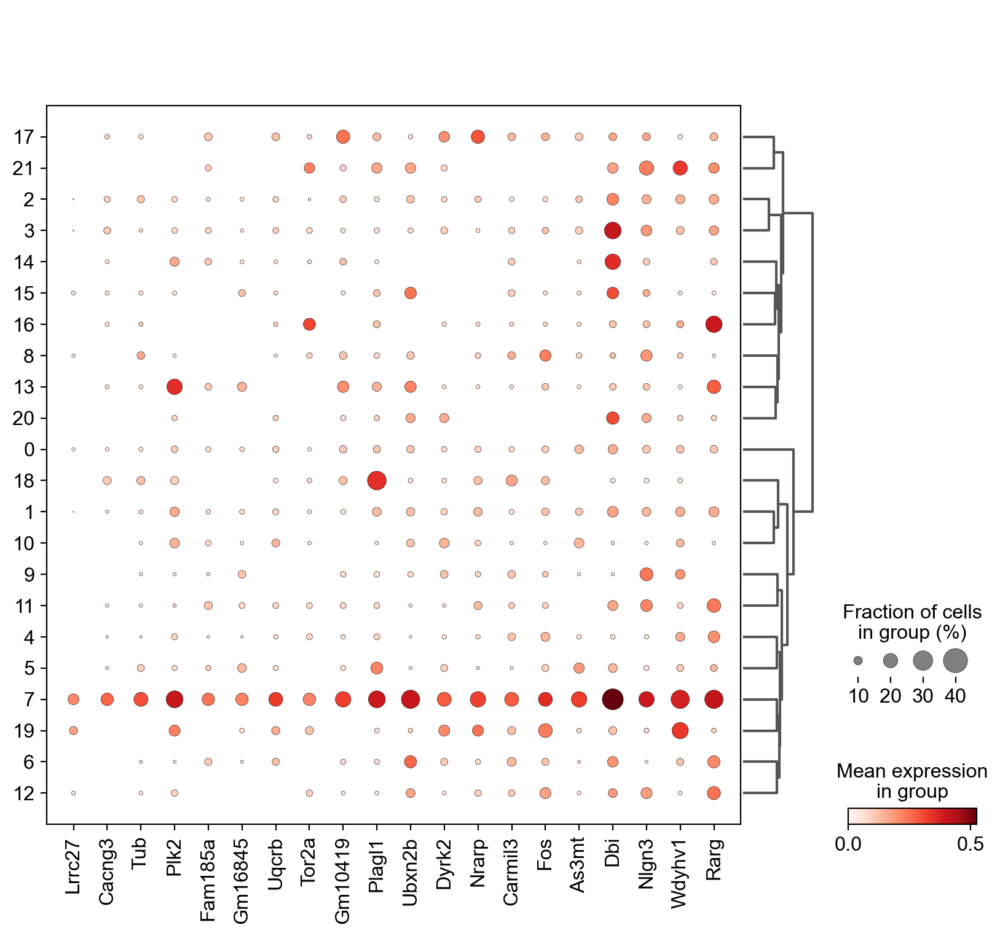

['Lrrc27', 'Cacng3', 'Tub', 'Plk2', 'Fam185a', 'Gm16845']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


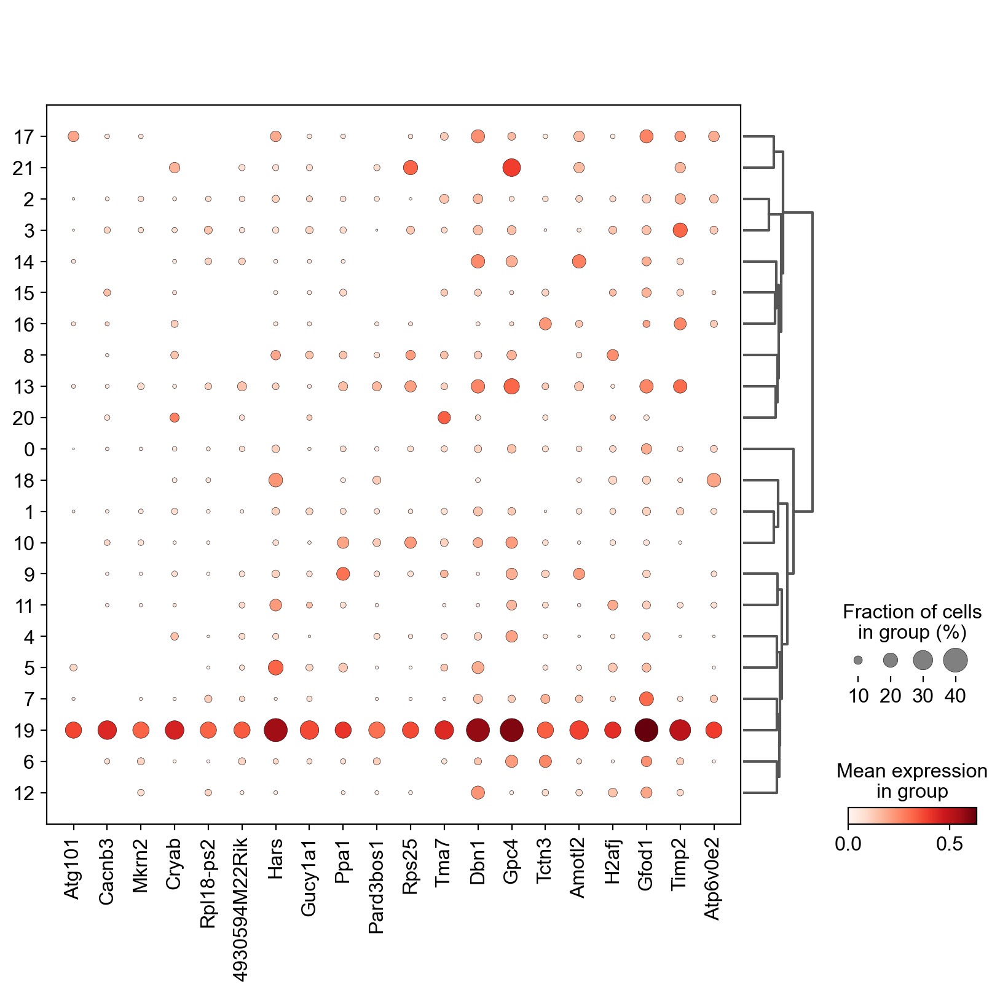

['Atg101', 'Cacnb3', 'Mkrn2', 'Cryab', 'Rpl18-ps2', '4930594M22Rik']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


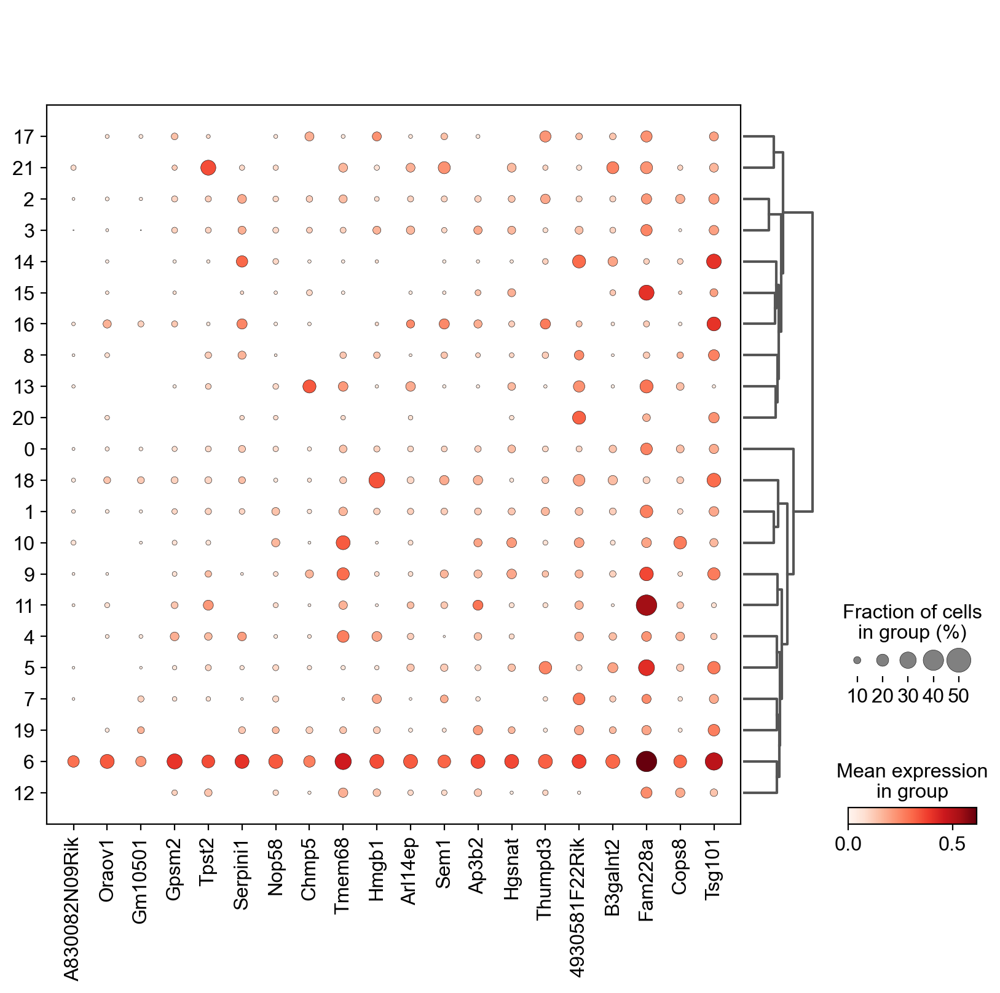

['A830082N09Rik', 'Oraov1', 'Gm10501', 'Gpsm2', 'Tpst2', 'Serpini1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


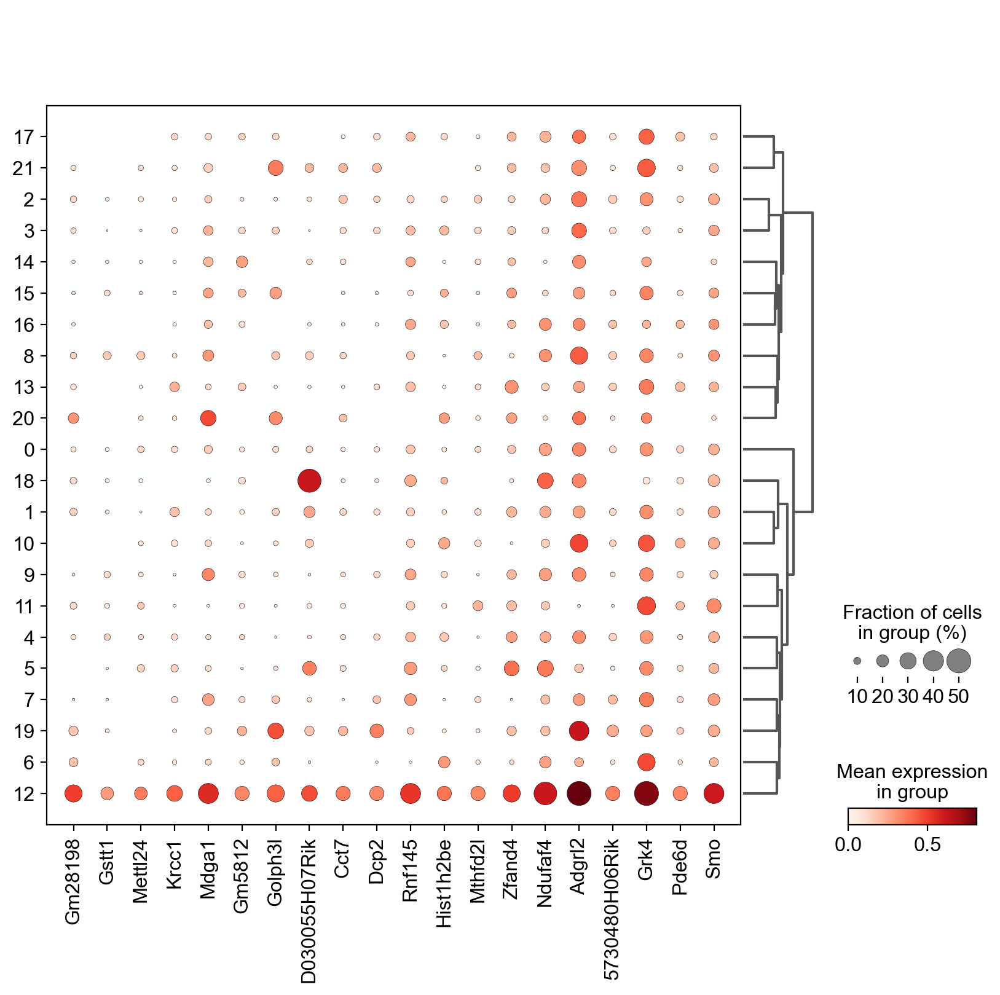

['Gm28198', 'Gstt1', 'Mettl24', 'Krcc1', 'Mdga1', 'Gm5812']


In [152]:
sc.tl.dendrogram(P38_astro, groupby='leiden', use_rep='X_harmony')

for i in P38_astro.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P38_astro, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P38_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P38_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P38_astro.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P38_astro.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P38_astro, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

In [222]:
P38_astro = P38[P38.obs.leiden=='0',:].concatenate(P38[P38.obs.leiden=='7',:])

P38_astro_clust = []
for i in range(P38_astro.shape[0]):
    if ( int(P38_astro.obs.leiden[i]) in (0, 4242) ): P38_astro_clust.append('Astro_C1')
    elif ( int(P38_astro.obs.leiden[i]) in (7, 4242) ): P38_astro_clust.append('Astro_C2')

P38_astro.obs['Astro_Num'] = P38_astro.obs['leiden']
P38_astro.obs['Astro_Num'] = pd.Series(P38_astro_clust, dtype='category').values

## Astro_C1 and C2 analysis

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


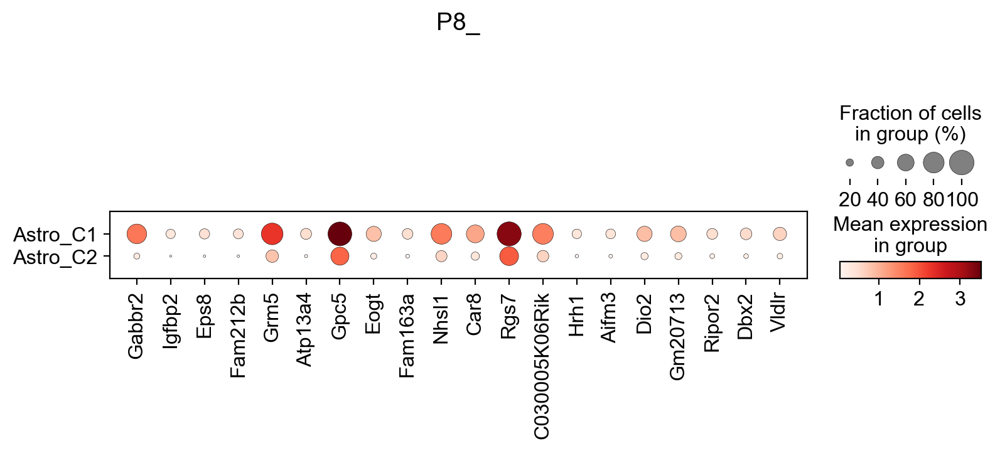

['Gabbr2', 'Igfbp2', 'Eps8', 'Fam212b', 'Grm5', 'Atp13a4']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


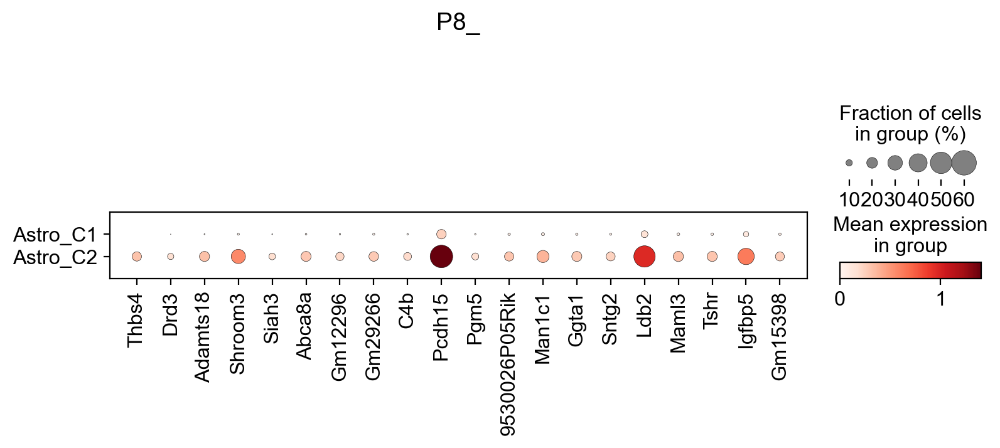

['Thbs4', 'Drd3', 'Adamts18', 'Shroom3', 'Siah3', 'Abca8a']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


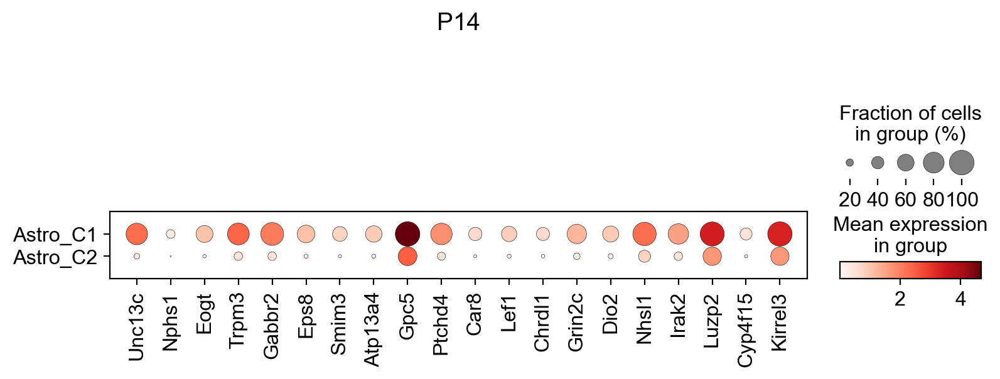

['Unc13c', 'Nphs1', 'Eogt', 'Trpm3', 'Gabbr2', 'Eps8']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


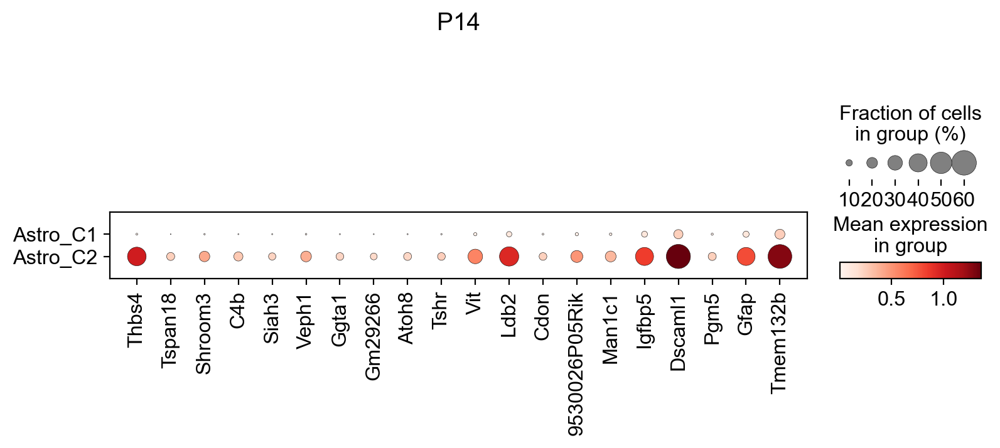

['Thbs4', 'Tspan18', 'Shroom3', 'C4b', 'Siah3', 'Veph1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


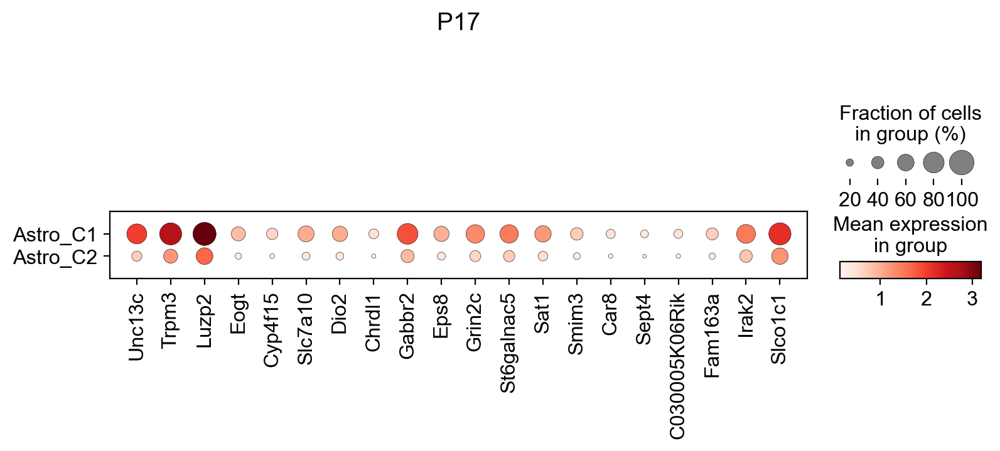

['Unc13c', 'Trpm3', 'Luzp2', 'Eogt', 'Cyp4f15', 'Slc7a10']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


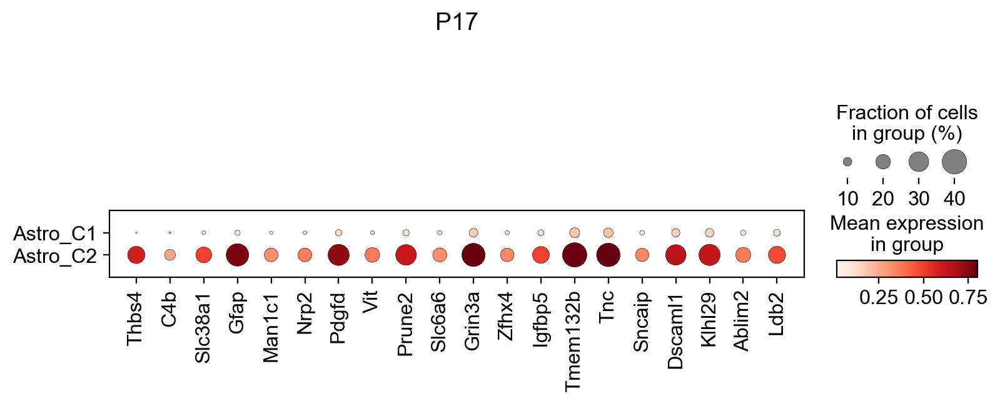

['Thbs4', 'C4b', 'Slc38a1', 'Gfap', 'Man1c1', 'Nrp2']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


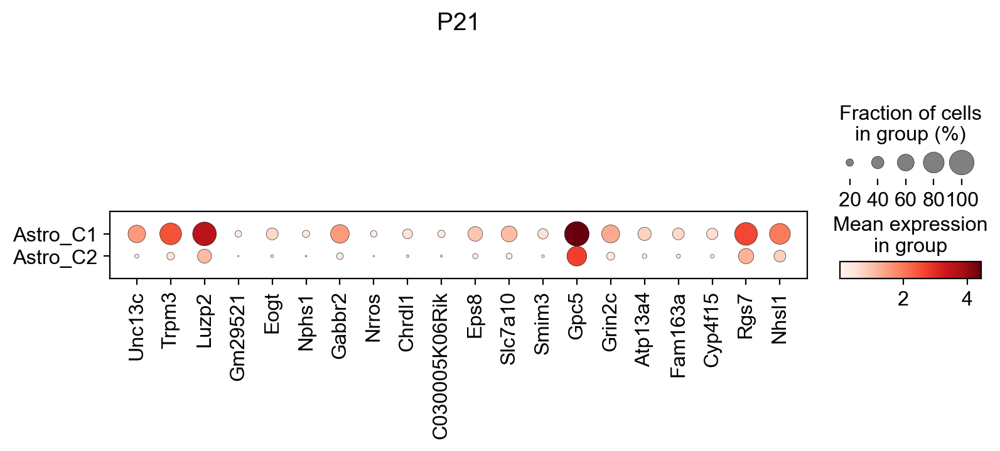

['Unc13c', 'Trpm3', 'Luzp2', 'Gm29521', 'Eogt', 'Nphs1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


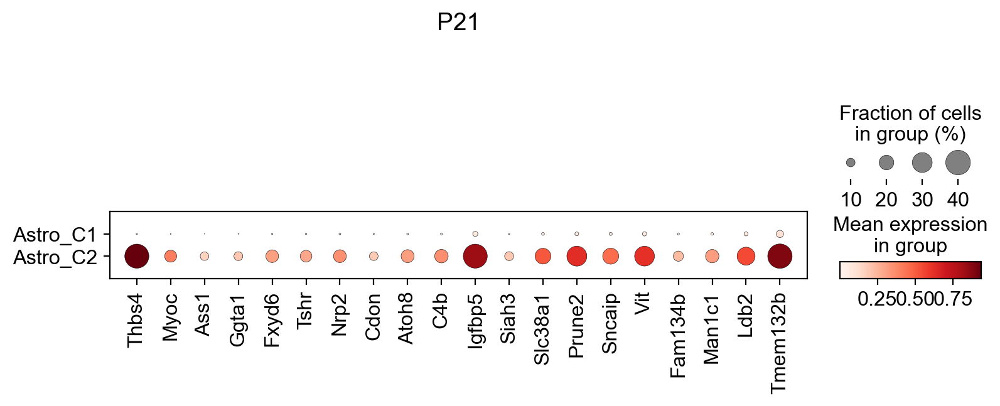

['Thbs4', 'Myoc', 'Ass1', 'Ggta1', 'Fxyd6', 'Tshr']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


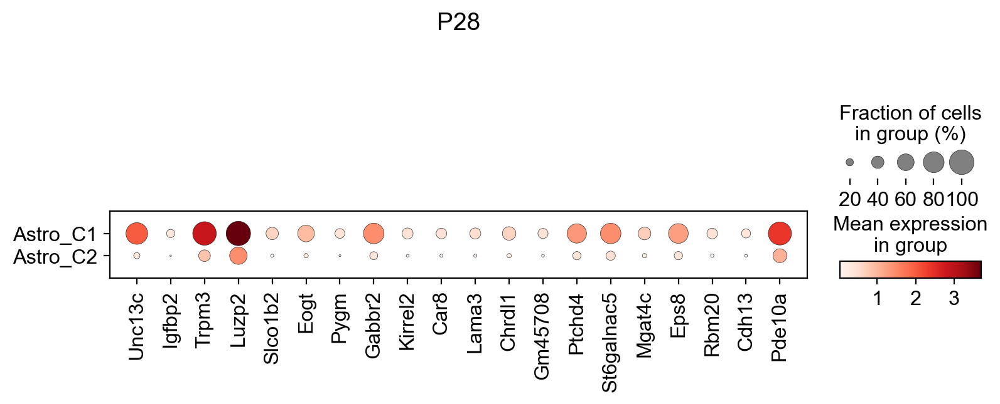

['Unc13c', 'Igfbp2', 'Trpm3', 'Luzp2', 'Slco1b2', 'Eogt']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


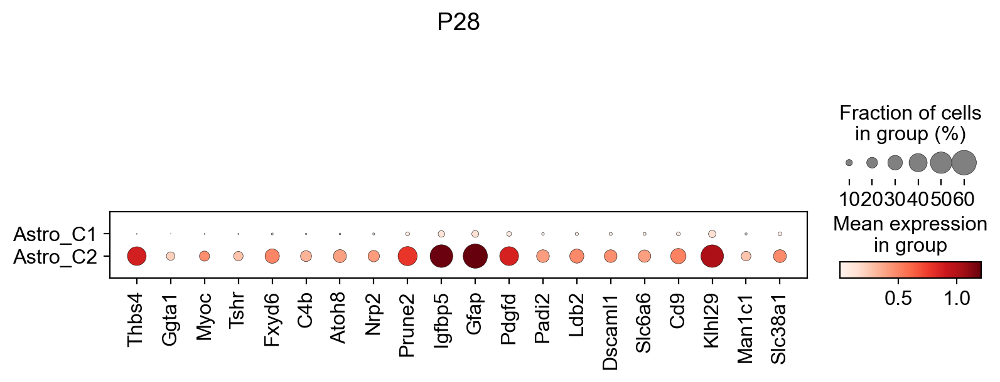

['Thbs4', 'Ggta1', 'Myoc', 'Tshr', 'Fxyd6', 'C4b']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


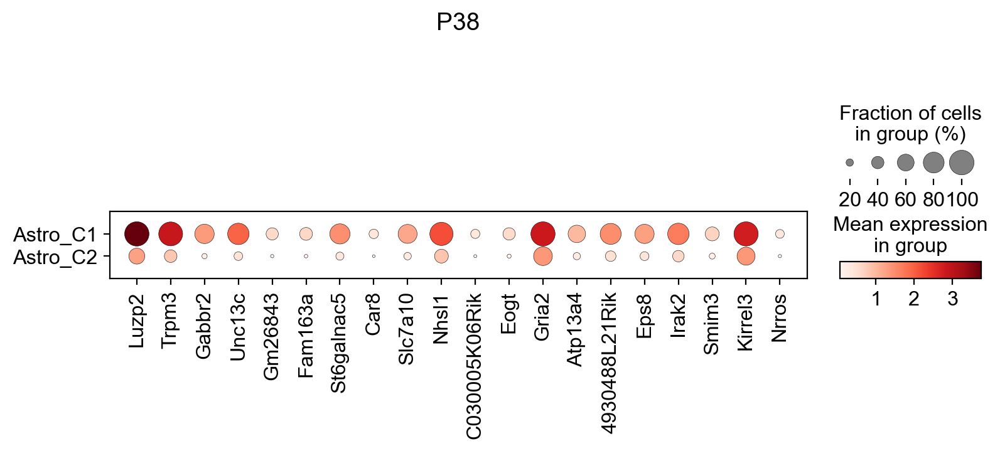

['Luzp2', 'Trpm3', 'Gabbr2', 'Unc13c', 'Gm26843', 'Fam163a']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


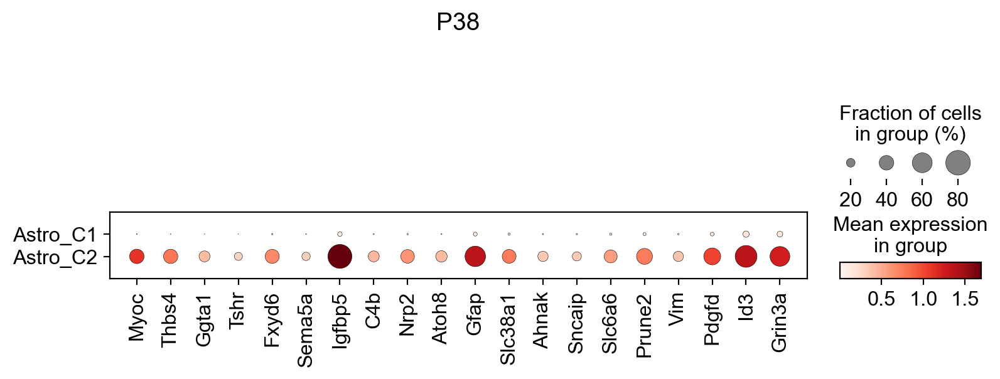

['Myoc', 'Thbs4', 'Ggta1', 'Tshr', 'Fxyd6', 'Sema5a']


In [204]:
#sc.tl.dendrogram(P38_astro, groupby='Astro_Num', use_rep='X_harmony')

astro_objs = [P8_astro, P14_astro, P17_astro, P21_astro, P28_astro, P38_astro]

for curr_astro_obj in astro_objs:
    Astro_Nums = pd.Series(curr_astro_obj.obs['Astro_Num'].values, dtype='category').values.categories
    for i in Astro_Nums:
        Astro_Num = i
        sc.tl.rank_genes_groups(curr_astro_obj, groupby='Astro_Num', groups=[Astro_Num], reference='rest', method='wilcoxon', n_genes=250)
        #wilcGenes23vRest = list(curr_astro_obj.uns['rank_genes_groups']['names'].astype([(Astro_Num, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
        #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

        wilcLF8v14 = curr_astro_obj.uns['rank_genes_groups']['logfoldchanges'].astype([(Astro_Num, '<f8')]).view('<f8') #log fold changes ordered by score

        wilcGenes8v14_s = list(curr_astro_obj.uns['rank_genes_groups']['names'].astype([(Astro_Num, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
        wilcLF8v14_s = curr_astro_obj.uns['rank_genes_groups']['logfoldchanges'].astype([(Astro_Num, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
        wilcLF8v14_s.sort() #log fold changes from lowest to highest
        wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
        for i in wilcLF8v14_s:
            gene_idx = np.where(wilcLF8v14 == i)[0][0]
            wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
        wilcGenes8v14_correct = []
        for i in reversed(wilcGenes8v14):
            wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

        sc.pl.dotplot(curr_astro_obj, wilcGenes8v14_correct[0:20], groupby='Astro_Num', title=curr_astro_obj.obs['sample'][0][0:3])
        print(wilcGenes8v14_correct[0:6])

In [205]:
ages = ['P8', 'P14', 'P17', 'P21', 'P28', 'P38']
idx = 0
for curr_astro_obj in astro_objs:
    astro_clust_age = []
    for i in range(curr_astro_obj.shape[0]):
        astro_clust_age.append(ages[idx] + '_' + curr_astro_obj.obs.Astro_Num[i])
    curr_astro_obj.obs['Age_Astro_Num'] = curr_astro_obj.obs['Astro_Num']
    curr_astro_obj.obs['Age_Astro_Num'] = pd.Series(astro_clust_age, dtype='category').values
    idx = idx + 1

In [206]:
astro_concat = P8_astro.concatenate(P14_astro, P17_astro, P21_astro, P28_astro, P38_astro, batch_categories=ages)

In [243]:
pd.Series(astro_concat.obs.Age_Astro_Num.values, dtype='category').values.categories

Index(['P14_Astro_C1', 'P14_Astro_C2', 'P17_Astro_C1', 'P17_Astro_C2',
       'P21_Astro_C1', 'P21_Astro_C2', 'P28_Astro_C1', 'P28_Astro_C2',
       'P38_Astro_C1', 'P38_Astro_C2', 'P8_Astro_C1', 'P8_Astro_C2'],
      dtype='object')

C2 markers expressed in only half of cells. Does this mean 2 clusters within C2 or are these genes expressed all over C2 but just dispersed? Let's check UMAP. 

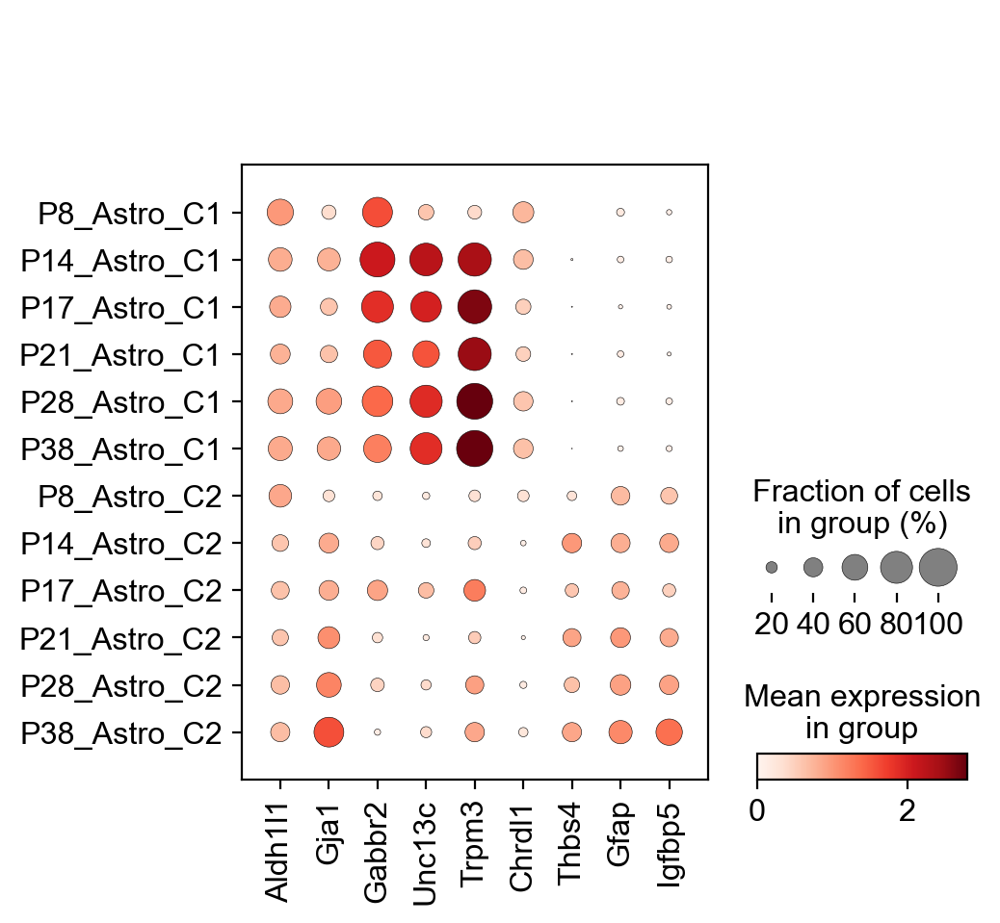

In [343]:
astro_markers = ['Aldh1l1', 'Gja1',
                 'Gabbr2', 'Unc13c', 'Trpm3', 'Chrdl1',
                'Thbs4', 'Gfap', 'Igfbp5']
sc.pl.dotplot(astro_concat, astro_markers, groupby='Age_Astro_Num', categories_order=['P8_Astro_C1',  'P14_Astro_C1', 'P17_Astro_C1', 
                                   'P21_Astro_C1', 'P28_Astro_C1', 'P38_Astro_C1', 
                                   'P8_Astro_C2', 'P14_Astro_C2', 'P17_Astro_C2', 
                                   'P21_Astro_C2', 'P28_Astro_C2', 'P38_Astro_C2'], save='_astro_num.pdf')

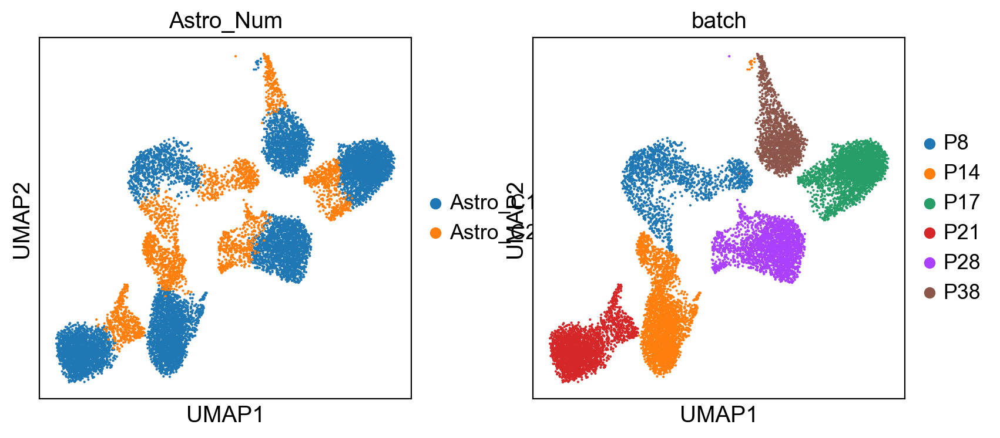

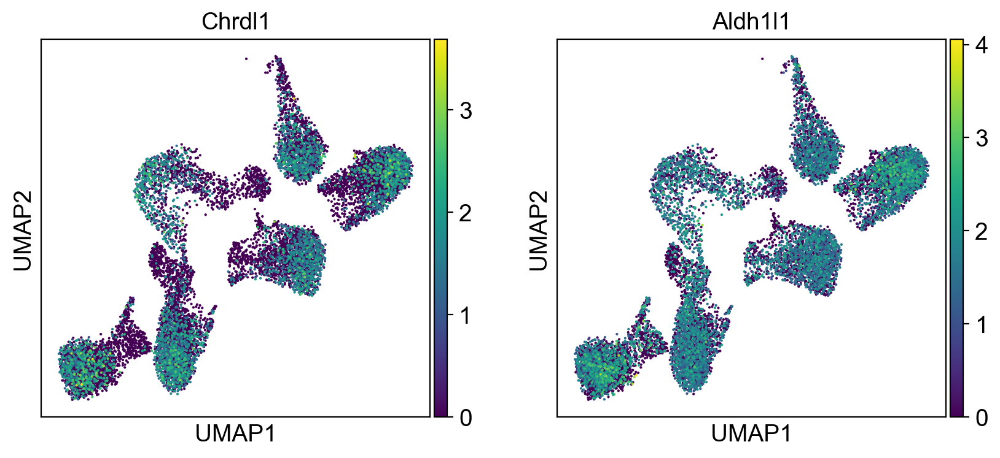

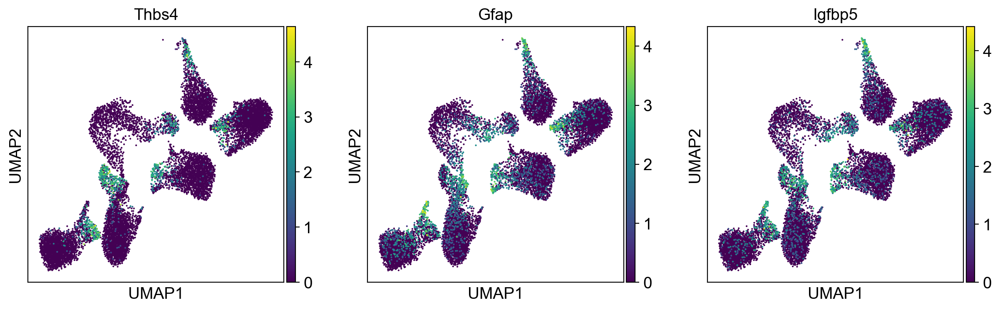

In [326]:
sc.pl.umap(astro_concat, color=['Astro_Num', 'batch'])
sc.pl.umap(astro_concat, color=['Chrdl1', 'Aldh1l1'])
sc.pl.umap(astro_concat, color=['Thbs4', 'Gfap', 'Igfbp5'])

In [353]:
P21_astro

AnnData object with n_obs × n_vars = 2527 × 24372
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample', 'n_genes', 'leiden', 'Class_broad', 'Astro_Num', 'Age_Astro_Num'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'mean', 'std', 'dispersions-0', 'dispersions_norm-0', 'dispersions-1', 'dispersions_norm-1'
    uns: 'rank_genes_groups'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [354]:
del P21_astro.obsp
del P21_astro.varm
del P21_astro.obsm
del P21_astro.uns


P21_astro.X = P21_astro.raw.X
sc.pp.highly_variable_genes(P21_astro, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P21_astro, max_value=10) #scale
sc.tl.pca(P21_astro, svd_solver='arpack') #run PCA

Z = harmonize(P21_astro.obsm['X_pca'], P21_astro.obs, batch_key = 'sample')
P21_astro.obsm['X_harmony'] = Z

sc.pp.neighbors(P21_astro, n_neighbors=25, use_rep='X_harmony')
#bbknn(P21_astro, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P21_astro)
sc.tl.umap(P21_astro)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


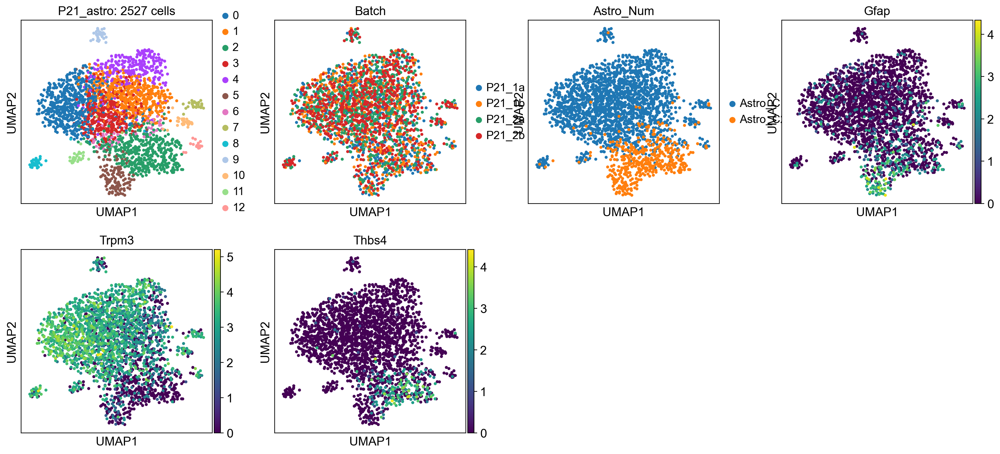

In [360]:
#sc.tl.leiden(P21_astro, resolution=1)
sc.pl.umap(P21_astro, color=['leiden', 'sample', 'Astro_Num', 'Gfap', 'Trpm3', 'Thbs4'], 
           title=['P21_astro: ' + str(P21_astro.shape[0]) + ' cells', 'Batch'])